# Building a Model
In this notebook I will take the learnings from `data_exploration.ipynb` and build a multiple linear regression model with a few selected predictor variables.

In [37]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import root_mean_squared_error, r2_score

resale_data_path = Path() / "data" / "resale_flat_prices_20260720.csv" # update path as necessary
ResalePrices = pd.read_csv(resale_data_path)

## Data Preparation and Train-Test Split

In [38]:
# basic data preparation without removing any outliers
def prepare_data(df):
    # drop the duplicates, re-number the index
    df = df.drop_duplicates(keep='first')
    # convert "month" to datetime datatype
    df['date'] = pd.to_datetime(ResalePrices['month'], format="%Y-%m", errors="coerce")
    # drop any rows with an invalid date
    df = df[~df['date'].isna()]
    # sort rows according to date, and re-number the index
    df = df.sort_values(by="date").reset_index(drop=True)

    # transform datatypes
    MIN_DATE = df['date'].min()
    df["regdate_months"] = (df['date'].dt.year * 12 + df['date'].dt.month) - (MIN_DATE.year * 12 + MIN_DATE.month)
    df['storey_range_cat'] = df['storey_range'].str.split(" TO ").str[1].astype(int) // 3
    ym = df['remaining_lease'].str.extract(r"(?:(\d+) years?)?\s?(?:(\d+) months?)?").fillna(0)
    df['remaining_lease_months'] = ym.loc[:, 0].astype(int) * 12 + ym.loc[:, 1].astype(int)

    # train-test split
    PREDICTORS = ["regdate_months", "storey_range_cat", "remaining_lease_months", "floor_area_sqm", "town", "flat_type", "flat_model"]
    RESPONSE = "resale_price"
    cutoff_date = df.iloc[int(df.shape[0] * 0.8)]['date']
    train = df[df['date'] <= cutoff_date]
    test = df[df['date'] > cutoff_date]

    X_train = train[PREDICTORS]
    X_test = test[PREDICTORS]
    y_train = train[RESPONSE]
    y_test = test[RESPONSE]

    return X_train, X_test, y_train, y_test

# separate function to remove outliers
def remove_outliers(df):
    return df

In [39]:
ResalePrices_Train, ResalePrices_Test, y_Train, y_Test = prepare_data(ResalePrices)
ResalePrices_Train

,regdate_months,storey_range_cat,remaining_lease_months,floor_area_sqm,town,flat_type,flat_model
0,0,4,736,44.0,ANG MO KIO,2 ROOM,Improved
1,0,1,981,100.0,SEMBAWANG,4 ROOM,Model A
2,0,2,976,100.0,SEMBAWANG,4 ROOM,Model A
3,0,1,990,86.0,SEMBAWANG,4 ROOM,Model A2
4,0,7,1067,110.0,QUEENSTOWN,5 ROOM,Improved
...,...,...,...,...,...,...,...
190505,92,1,725,63.0,KALLANG/WHAMPOA,3 ROOM,Simplified
190506,92,3,557,68.0,KALLANG/WHAMPOA,3 ROOM,Improved
190507,92,3,662,66.0,KALLANG/WHAMPOA,3 ROOM,Improved
190508,92,3,725,63.0,KALLANG/WHAMPOA,3 ROOM,Simplified


## Correlation

In [40]:
ResalePrices_Train[['regdate_months', 'storey_range_cat', 'remaining_lease_months', 'floor_area_sqm']].corr()

,regdate_months,storey_range_cat,remaining_lease_months,floor_area_sqm
regdate_months,1.000000,0.013117,-0.021792,-0.036926
storey_range_cat,0.013117,1.000000,0.274738,-0.014005
remaining_lease_months,-0.021792,0.274738,1.000000,0.117886
floor_area_sqm,-0.036926,-0.014005,0.117886,1.000000


## Modelling
In the notebook `data_exploration.ipynb`, there were multiple issues with the multiple linear regression with **all** predictor variables. Even though it achieved a decently high R^2 of `0.863` the Residual-Fitted plot shows nonlinearity.

In this section I will build a multiple linear regression with only selected variables, and visualize diagnostic plots to aid my decisions.

In [41]:
def build_design_matrix(X_train, X_test, cols):
    # supports building a design matrix M for these inputs:
    # - ["col1", "col2"]                    -> builds M with the desired columns (one-hot encode as needed)
    # - ["col1", ("col1", 2)]               -> builds M with "col1" and "col1"'s 2nd degree polynomial term
    # - ["col1", "col2", ("col1", "col2")]  -> builds M with "col1", "col2", and interaction between "col1" and "col2"
    # - ["col1", "col2", ("col1", 2), ("col1", "col2"), (("col1", 2), "col2")] -> last item adds interaction between "col1"'s 2nd degree poly and "col2"

    # concatenate the training and test sets to ensure consistent one-hot encoding
    df = pd.concat([X_train, X_test], axis=0)

    def get_col(col):
        # individual predictor
        if type(col) is str:
            if col in ['regdate_months', 'storey_range_cat', 'remaining_lease_months', 'floor_area_sqm']:
                return df[[col]]
            else: # 'town', 'flat_type', 'flat_model'
                return pd.get_dummies(df[[col]], columns=[col], drop_first=True, dtype=int)

        # tuple, can be polynomial, log or interaction
        elif type(col) is tuple:
            assert len(col) == 2
            if type(col[1]) is int or type(col[1]) is float:
                transform = col[1]
                if transform == 1:
                    return get_col(col[0])
                else:
                    return (get_col(col[0]) ** transform).add_suffix(f"^{transform}")
            elif col[1] == "log":
                return np.log(get_col(col[0])).add_suffix("(log)")
            else:
                # interaction term
                int1 = get_col(col[0])
                int2 = get_col(col[1])
                # compute the pairwise products using numpy broadcasting
                # (n, m1, 1) * (n, 1, m2) -> (n, m1, m2)
                products = int1.to_numpy()[:, :, None] * int2.to_numpy()[:, None, :]
                # reshape to (n, m1 * m2)
                prod_matrix = products.reshape(len(int1), -1)
                # generate descriptive column names
                col_names = [f"{c1}*{c2}" for c1 in int1.columns for c2 in int2.columns]
                # construct dataframe with product matrix
                interaction = pd.DataFrame(prod_matrix, index=int1.index, columns=col_names)
                # drop any columns without data (e.g. there are no flat_type_MULTI-GENERATION homes in town_BEDOK)
                interaction = interaction.loc[:, (interaction != 0).any(axis=0)]
                return interaction
        else:
            raise ValueError(f"Invalid column specification: {col}")

    M_train = pd.DataFrame()
    M_test = pd.DataFrame()

    for col in cols:
        c = get_col(col)
        M_train = pd.concat([M_train, c.iloc[:len(X_train), :]], axis=1)
        M_test = pd.concat([M_test, c.iloc[len(X_train):, :]], axis=1)

    M_train = sm.add_constant(M_train)
    M_test = sm.add_constant(M_test)
    return M_train, M_test

In [42]:
# test build_design_matrix function
M_train, M_test = build_design_matrix(ResalePrices_Train, ResalePrices_Test, ['flat_type', 'regdate_months', ('regdate_months', 2), ('flat_type', 'regdate_months')])
M_train.iloc[40000:40005]

,const,flat_type_2 ROOM,flat_type_3 ROOM,flat_type_4 ROOM,flat_type_5 ROOM,flat_type_EXECUTIVE,flat_type_MULTI-GENERATION,regdate_months,regdate_months^2,flat_type_2 ROOM*regdate_months,flat_type_3 ROOM*regdate_months,flat_type_4 ROOM*regdate_months,flat_type_5 ROOM*regdate_months,flat_type_EXECUTIVE*regdate_months,flat_type_MULTI-GENERATION*regdate_months
40000,1.0,0,1,0,0,0,0,22,484,0,22,0,0,0,0
40001,1.0,0,0,1,0,0,0,22,484,0,0,22,0,0,0
40002,1.0,0,0,1,0,0,0,22,484,0,0,22,0,0,0
40003,1.0,0,0,1,0,0,0,22,484,0,0,22,0,0,0
40004,1.0,0,0,1,0,0,0,22,484,0,0,22,0,0,0


In [43]:
def plot_diagnostics(result, title=None):
    fig, axs = plt.subplots(figsize=(16, 4), ncols=4)
    if title:
        fig.suptitle(title)

    # residual vs fitted value
    axs[0].scatter(result.fittedvalues, result.resid)
    axs[0].axhline(y=0, c='b', ls='--', label="residual = 0")
    delta = 0.01 * (result.fittedvalues.max() - result.fittedvalues.min()) # use an appropriate delta to save computation time
    lowess = sm.nonparametric.lowess(result.resid, result.fittedvalues, delta=delta, return_sorted=True)
    lowess_x = lowess[:, 0]
    lowess_y = lowess[:, 1]
    axs[0].plot(lowess_x, lowess_y, c='r', ls='--', label="LOWESS line")
    axs[0].set_ylabel("Residual")
    axs[0].set_xlabel("Fitted Values")
    axs[0].legend()

    # q-q plot of residual quantile distribution vs theoretical normal distribution
    sm.qqplot(result.get_influence().resid_studentized_internal, loc=0, scale=1, line="45", ax=axs[1])

    # scale-location plot
    scale_location_y = np.sqrt(np.abs(result.get_influence().resid_studentized_internal))
    axs[2].scatter(result.fittedvalues, scale_location_y)
    delta = 0.01 * (result.fittedvalues.max() - result.fittedvalues.min())
    lowess = sm.nonparametric.lowess(scale_location_y, result.fittedvalues, delta=delta, return_sorted=True)
    lowess_x = lowess[:, 0]
    lowess_y = lowess[:, 1]
    axs[2].plot(lowess_x, lowess_y, c='r', ls='--', label="LOWESS line")
    axs[2].set_ylabel("sqrt(abs(Studentized Residual))")
    axs[2].set_xlabel("Fitted Values")
    axs[2].legend()

    # residual vs leverage
    stud_resid = result.get_influence().resid_studentized_internal
    leverage = result.get_influence().hat_matrix_diag
    num_predictors = len(result.model.exog_names) - 1
    axs[3].scatter(leverage, stud_resid)
    leverage_x = np.linspace(leverage.min(), leverage.max(), 50)
    cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
    cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
    axs[3].set_xlim(*axs[3].get_xlim()) # set limits before plotting Cook's Distance
    axs[3].set_ylim(*axs[3].get_ylim())
    axs[3].plot(leverage_x, cooks_dist_001, c='r', ls='--', label="Cook's Distance = 0.01")
    axs[3].plot(leverage_x, -cooks_dist_001, c='r', ls='--')
    axs[3].plot(leverage_x, cooks_dist_0001, c='orange', ls='--', label="Cook's Distance = 0.001")
    axs[3].plot(leverage_x, -cooks_dist_0001, c='orange', ls='--')
    axs[3].set_xlabel("Leverage")
    axs[3].set_ylabel("Studentized Residual")
    axs[3].legend()

    plt.tight_layout()

In [44]:
def test_predictors(X_train, y_train, X_test, y_test, curr, new_preds, print_results=True):
    # supports easy testing of new predictors when added to the current predictors for OLS regression
    # - curr: list of current predictors (e.g. ["flat_type"])
    # - new_preds: dictionary of new predictors to test (e.g. {"regdate_months": ["regdate_months"]})
    #   - key: feature name (string)
    #   - value: list of predictors associated with that feature, this may include interaction/polynomial terms

    results = []
    for feature_key, preds in new_preds.items():
        cols = [*curr, *preds]
        M_train, M_test = build_design_matrix(X_train, X_test, cols)

        result = sm.OLS(y_train, M_train).fit()
        results.append({
            'feature': feature_key,
            'f_pvalue': result.f_pvalue,
            'rsquared': result.rsquared,
            'rsquared_adj': result.rsquared_adj,
            'aic': result.aic,
            'bic': result.bic,
            # evaluation on test set
            'rmse_test': root_mean_squared_error(y_test, result.predict(M_test)),
            'r2_test': r2_score(y_test, result.predict(M_test)),
        })
        if print_results:
            print(result.summary())
        plot_diagnostics(result, title=f"Diagnostics for '{feature_key}'")
    return pd.DataFrame(results).set_index('feature')

### 1 Predictor Variable
Here I conduct univariate modelling, with polynomials for selected predictors (added based on the shapes in the residual plots). 
I also test the difference between simply using the response as-is, or applying a log(Y) transformation to the response.

#### `Y` (no transformation)

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                 2.418e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:58:26   Log-Likelihood:            -2.5598e+06
No. Observations:              190510   AIC:                         5.120e+06
Df Residuals:                  190508   BIC:                         5.120e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           3.941e+05    802.727    490.

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
regdate_months,0.0,0.112632,0.112627,5.119565e+06,5.119585e+06,207181.469858,-0.016277
storey_range_cat,0.0,0.123212,0.123208,5.117280e+06,5.117300e+06,240862.684327,-0.373566
floor_area_sqm,0.0,0.352635,0.352631,5.059488e+06,5.059508e+06,223645.651083,-0.184217
floor_area_sqm (polynomial),0.0,0.354411,0.354404,5.058967e+06,5.058997e+06,223197.185316,-0.179473
remaining_lease_months,0.0,0.101376,0.101371,5.121966e+06,5.121987e+06,246182.968340,-0.434916
remaining_lease_months (polynomial),0.0,0.113023,0.113013,5.119483e+06,5.119514e+06,245736.828257,-0.429720
town,0.0,0.107197,0.107080,5.120776e+06,5.121040e+06,244984.336552,-0.420977
flat_type,0.0,0.373684,0.373664,5.053200e+06,5.053272e+06,220593.810057,-0.152118
flat_model,0.0,0.285623,0.285548,5.078291e+06,5.078504e+06,230101.309976,-0.253570


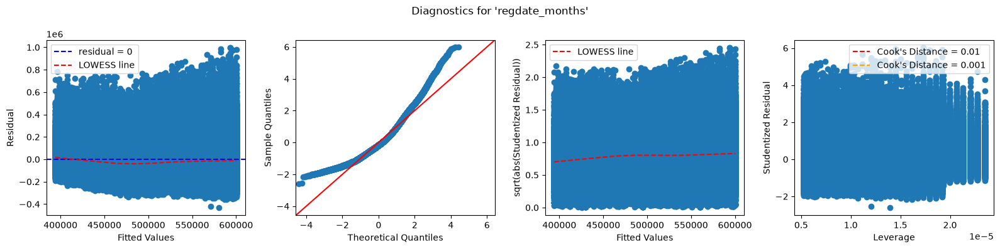

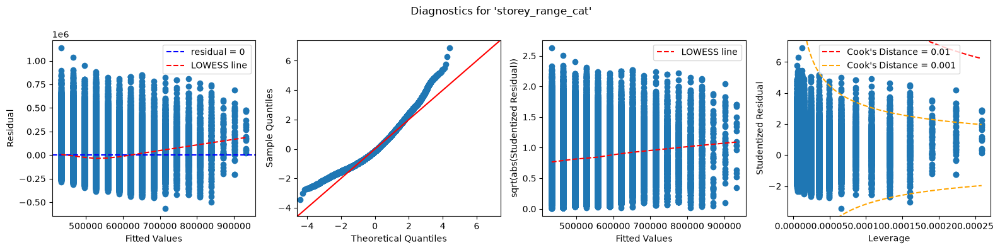

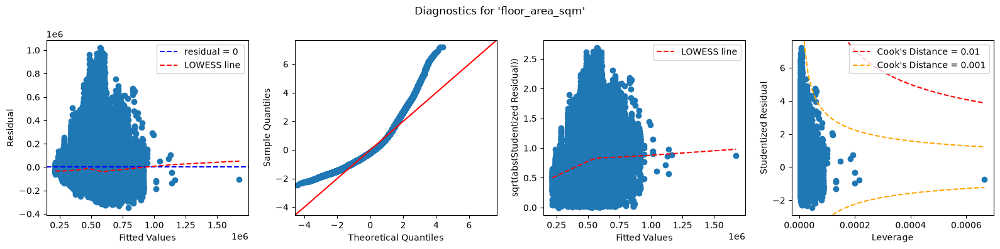

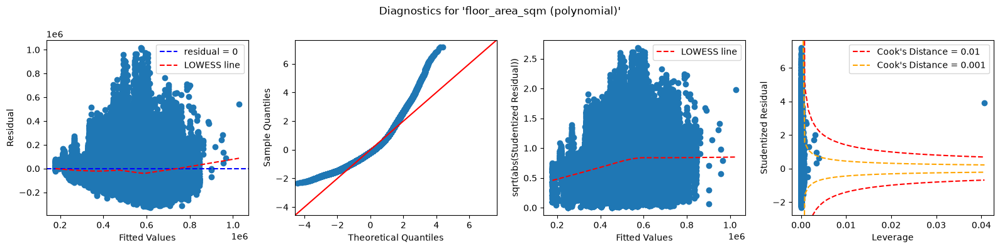

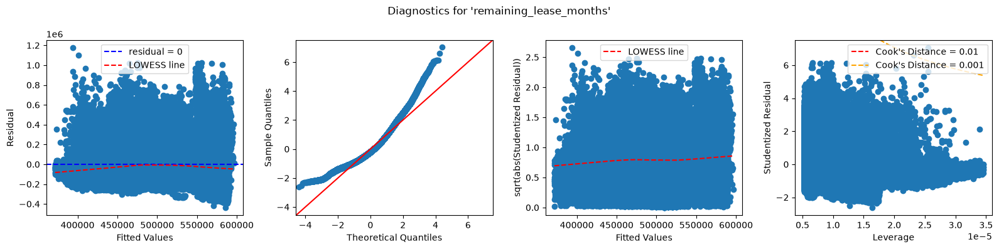

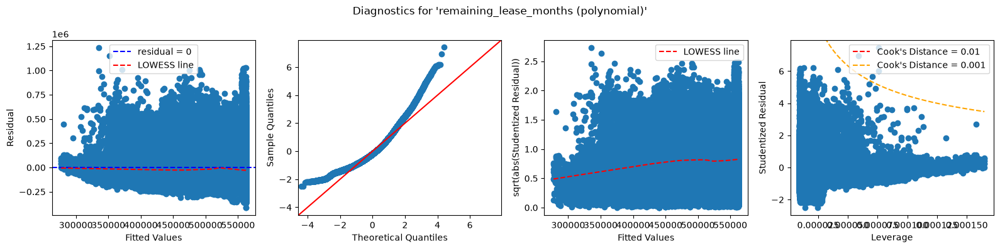

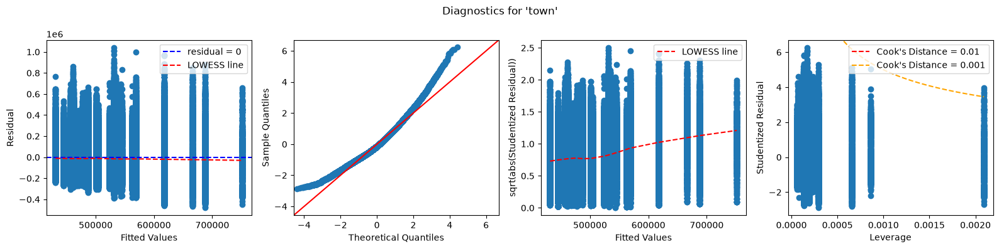

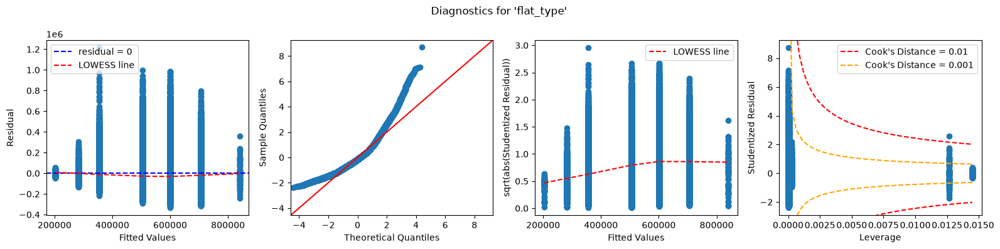

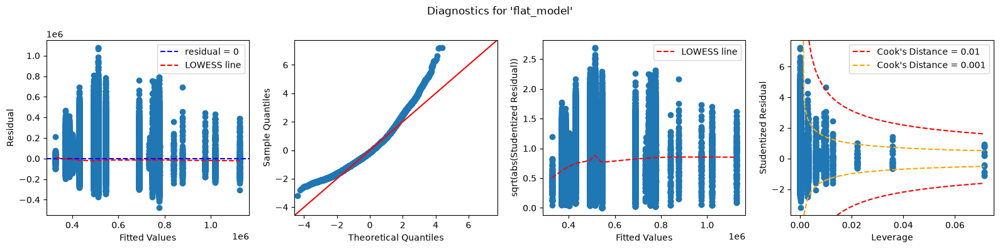

In [45]:
test_predictors(ResalePrices_Train, y_Train, ResalePrices_Test, y_Test, [], {
    'regdate_months': ['regdate_months'],
    'storey_range_cat': ['storey_range_cat'],
    'floor_area_sqm': ['floor_area_sqm'],
    'floor_area_sqm (polynomial)': ['floor_area_sqm', ('floor_area_sqm', 2)],
    'remaining_lease_months': ['remaining_lease_months'],
    'remaining_lease_months (polynomial)': ['remaining_lease_months', ('remaining_lease_months', 2)],
    'town': ['town'],
    'flat_type': ['flat_type'],
    'flat_model': ['flat_model'],
})

#### `log(Y)` transformation

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.125
Method:                 Least Squares   F-statistic:                 2.726e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:59:38   Log-Likelihood:                -51743.
No. Observations:              190510   AIC:                         1.035e+05
Df Residuals:                  190508   BIC:                         1.035e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             12.8489      0.002   8350.

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
regdate_months,0.0,0.125171,0.125166,103489.991542,103510.306462,0.308714,-0.007085
storey_range_cat,0.0,0.104321,0.104316,107977.128122,107997.443042,0.392302,-0.626285
floor_area_sqm,0.0,0.407752,0.407749,29171.293500,29191.608420,0.359748,-0.367578
floor_area_sqm (polynomial),0.0,0.422210,0.422204,24464.991832,24495.464212,0.356985,-0.346648
remaining_lease_months,0.0,0.127395,0.127390,103005.014058,103025.328978,0.398323,-0.676582
remaining_lease_months (polynomial),0.0,0.146949,0.146940,98689.407882,98719.880262,0.398993,-0.682226
town,0.0,0.092914,0.092795,110436.143504,110700.237464,0.399445,-0.686045
flat_type,0.0,0.441804,0.441786,17900.472306,17971.574526,0.353133,-0.317748
flat_model,0.0,0.269624,0.269548,69146.709086,69360.015746,0.376386,-0.497001


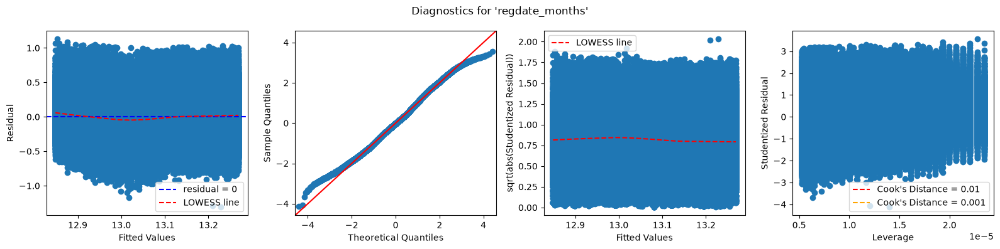

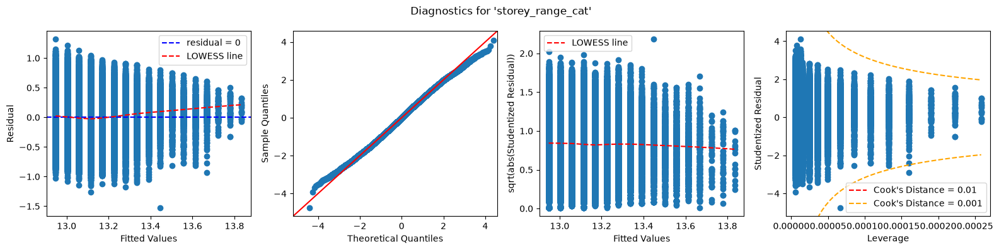

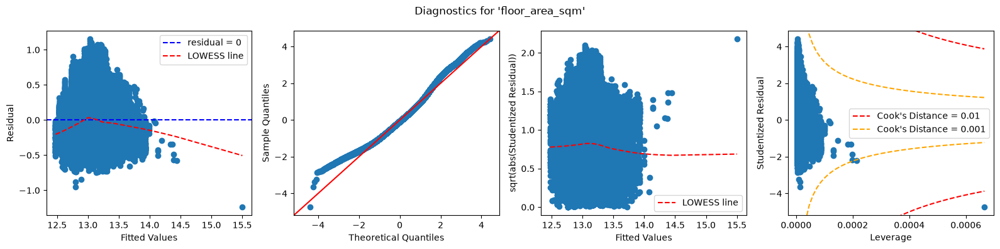

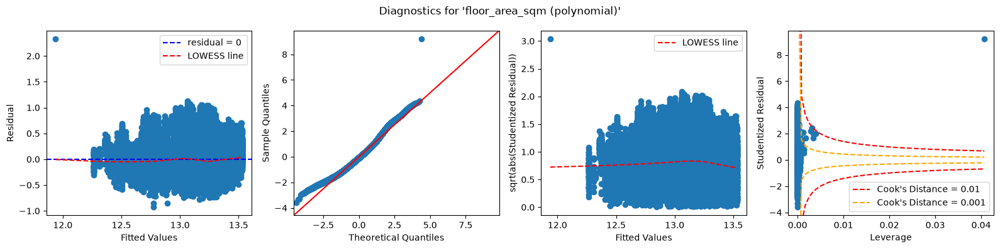

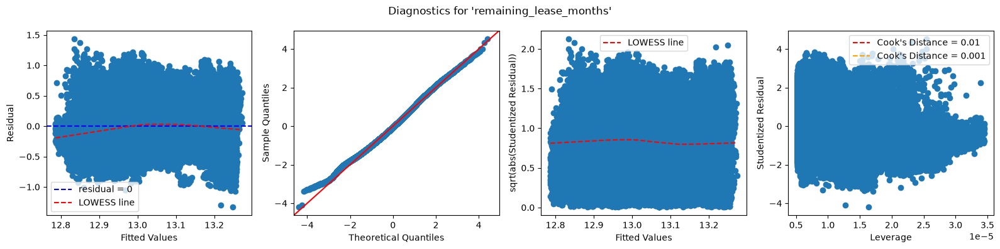

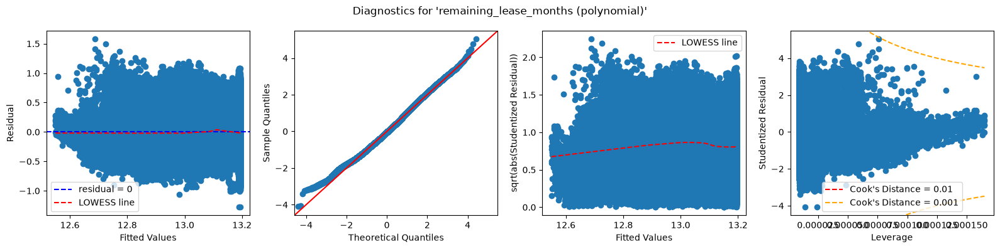

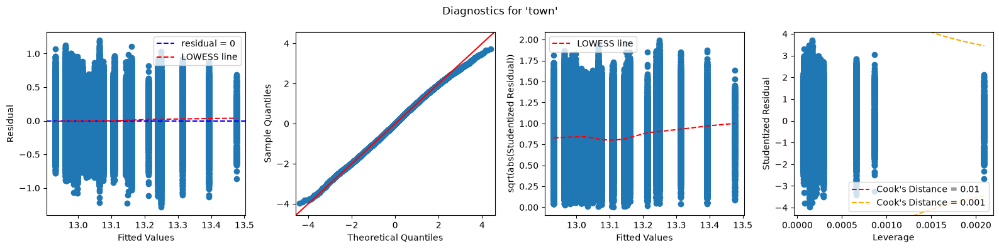

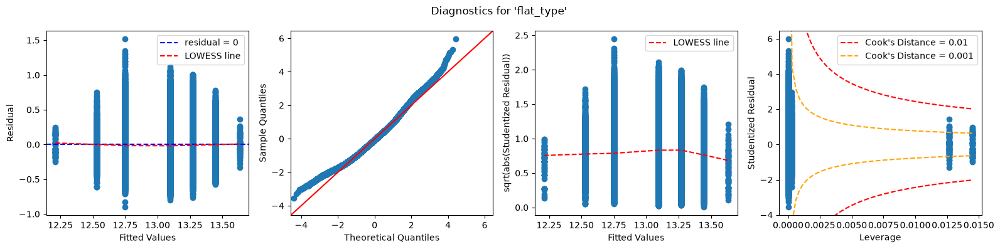

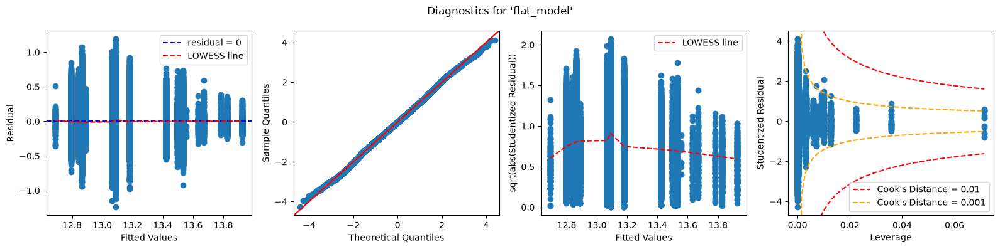

In [46]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), [], {
    'regdate_months': ['regdate_months'],
    'storey_range_cat': ['storey_range_cat'],
    'floor_area_sqm': ['floor_area_sqm'],
    'floor_area_sqm (polynomial)': ['floor_area_sqm', ('floor_area_sqm', 2)],
    'remaining_lease_months': ['remaining_lease_months'],
    'remaining_lease_months (polynomial)': ['remaining_lease_months', ('remaining_lease_months', 2)],
    'town': ['town'],
    'flat_type': ['flat_type'],
    'flat_model': ['flat_model'],
})

#### 1 Predictor Model Conclusion
The log(Y) transformation showed overall higher R-squared values, and better Residual-Fitted Value plots and Q-Q normality plots. Hence for the following more complex models I will go with the log(Y) transformation.

`flat_type` had the highest training R^2, while `regdate_months` had the highest test R^2. This makes sense because the test set contains resale prices that are in the future of the observations in the training set.

Hence, `regdate_months` should be the first predictor, as it acts as a proxy for modelling the impact of inflation.

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.125
Method:                 Least Squares   F-statistic:                 2.726e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        19:00:50   Log-Likelihood:                -51743.
No. Observations:              190510   AIC:                         1.035e+05
Df Residuals:                  190508   BIC:                         1.035e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             12.8489      0.002   8350.

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
regdate_months,0.0,0.125171,0.125166,103489.991542,103510.306462,0.308714,-0.007085


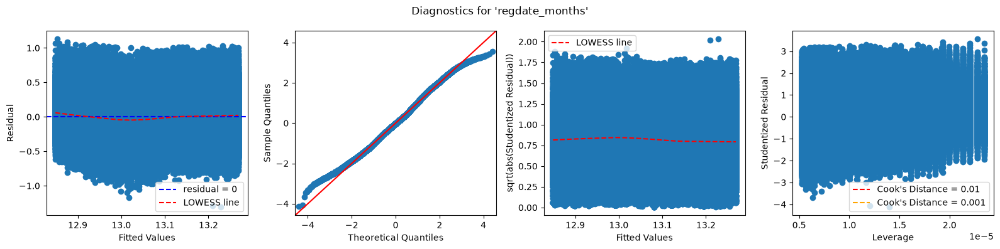

In [47]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), [], {
    'regdate_months': ['regdate_months'],
})

### 2 Predictor Variables

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 2.790e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        19:01:02   Log-Likelihood:                -40013.
No. Observations:              190510   AIC:                         8.003e+04
Df Residuals:                  190507   BIC:                         8.006e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               12.6739      0.002  

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
storey_range_cat,0.0,0.226533,0.226525,80031.460807,80061.933187,0.289953,0.111598
floor_area_sqm,0.0,0.550358,0.550354,-23307.176887,-23276.704507,0.220405,0.486669
floor_area_sqm (polynomial),0.0,0.564641,0.564635,-29455.044368,-29414.414528,0.215557,0.509001
floor_area_sqm (log),0.0,0.565822,0.565818,-29974.530789,-29944.058409,0.215661,0.508531
remaining_lease_months,0.0,0.258192,0.258184,72069.577242,72100.049621,0.278809,0.178577
town,0.0,0.219638,0.219532,81770.178477,82044.429896,0.295243,0.078882
flat_type,0.0,0.580189,0.580173,-36374.799050,-36293.539370,0.210349,0.532443
flat_model,0.0,0.394553,0.394486,33410.557243,33634.021363,0.259435,0.288765


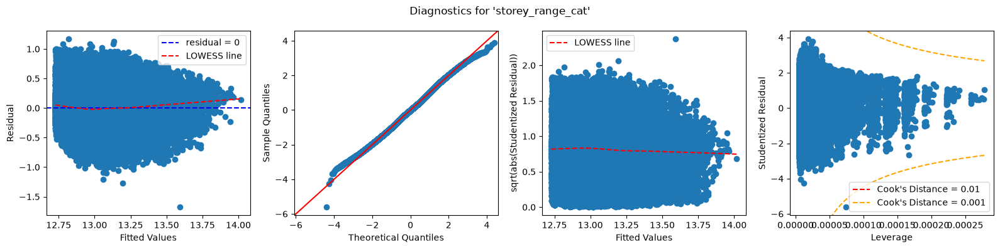

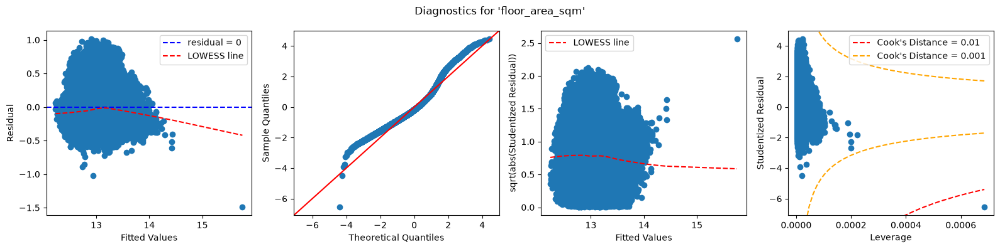

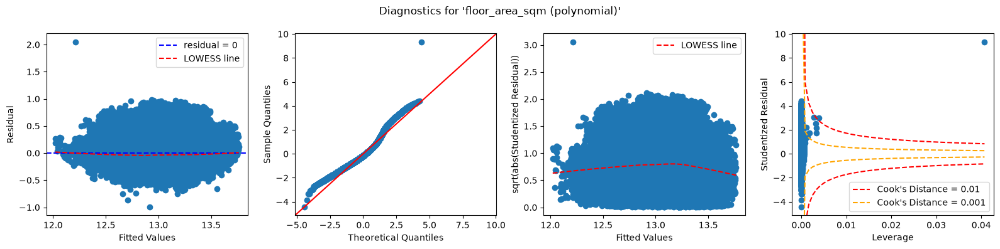

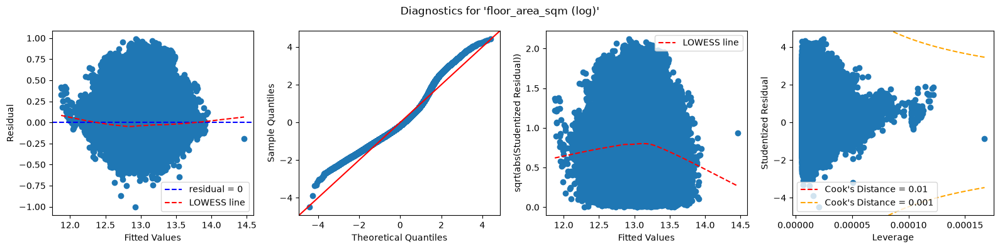

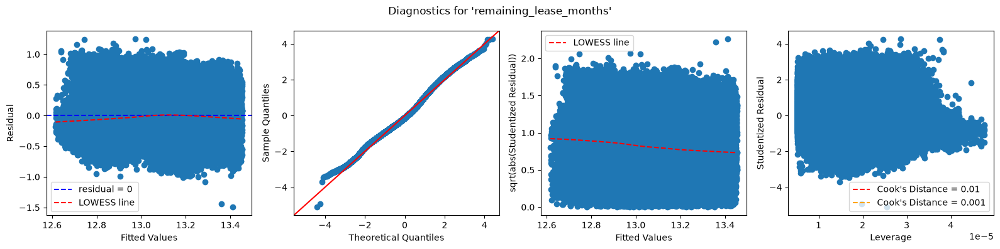

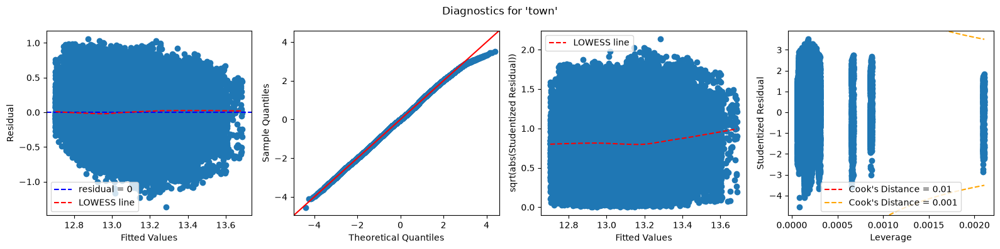

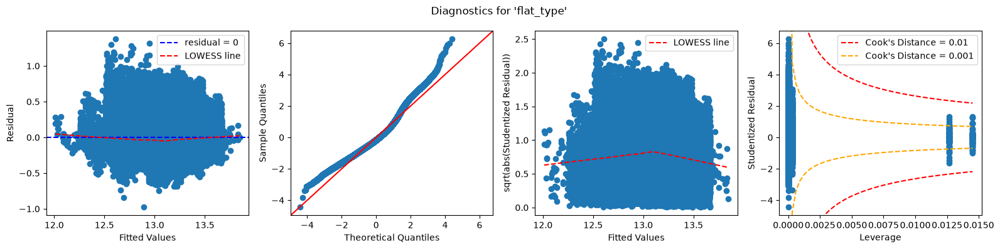

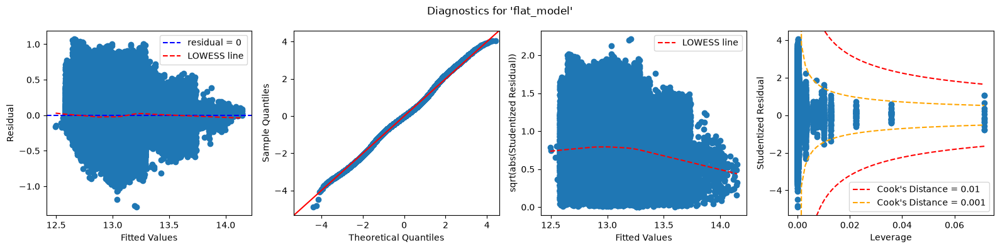

In [48]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['regdate_months'], {
    'storey_range_cat': ['storey_range_cat'],
    'floor_area_sqm': ['floor_area_sqm'],
    'floor_area_sqm (polynomial)': ['floor_area_sqm', ('floor_area_sqm', 2)],
    'floor_area_sqm (log)': [('floor_area_sqm', 'log')],
    'remaining_lease_months': ['remaining_lease_months'],
    'town': ['town'],
    'flat_type': ['flat_type'],
    'flat_model': ['flat_model'],
})

#### 2 Predictor Model Conclusion
`flat_type` showed the best R^2 and lowest bic in the training set, and also showed the highest test R^2.
`floor_area_sqm` comes as a close second, with its logarithmic and polynomial transformations performing slightly better.

I will select `flat_type` as the 2nd predictor to include in the model.

### 3 Predictor Variables

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.664
Method:                 Least Squares   F-statistic:                 4.701e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        19:02:08   Log-Likelihood:                 39347.
No. Observations:              190510   AIC:                        -7.868e+04
Df Residuals:                  190501   BIC:                        -7.858e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
storey_range_cat,0.0,0.663784,0.663770,-78675.971106,-78584.553966,0.186733,0.631533
floor_area_sqm,0.0,0.584222,0.584205,-38212.210368,-38120.793228,0.209877,0.534540
floor_area_sqm (log),0.0,0.584763,0.584746,-38460.237453,-38368.820313,0.209584,0.535835
floor_area_sqm * flat_type,0.0,0.592454,0.592426,-42011.652350,-41869.447910,0.207899,0.543269
floor_area_sqm (log) * flat_type,0.0,0.592582,0.592552,-42069.410798,-41917.048898,0.207761,0.543877
remaining_lease_months,0.0,0.630075,0.630059,-60473.275981,-60381.858841,0.184173,0.641567
remaining_lease_months (log),0.0,0.627078,0.627063,-58936.349035,-58844.931895,0.184550,0.640098
flat_model,0.0,0.656027,0.655981,-74294.773677,-74020.522258,0.188253,0.625511
town,0.0,0.720398,0.720351,-113755.373319,-113420.177140,0.182052,0.649778


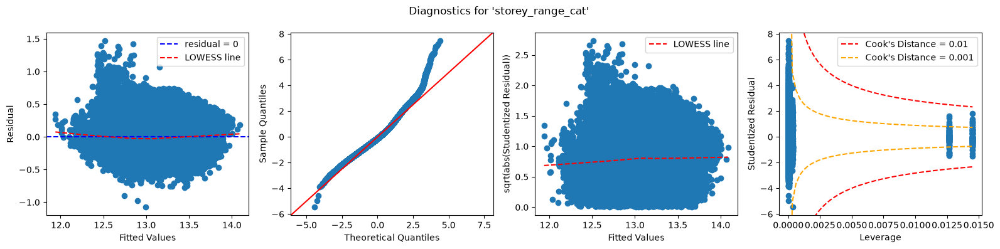

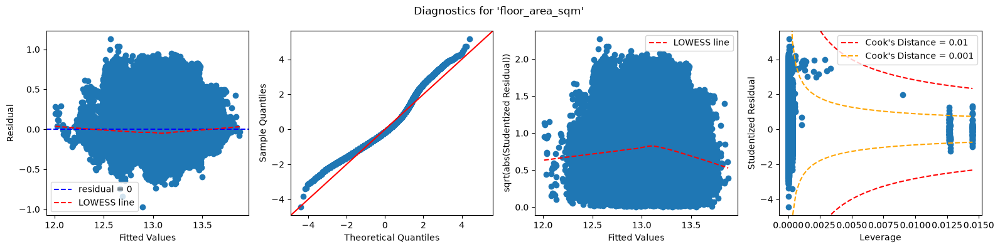

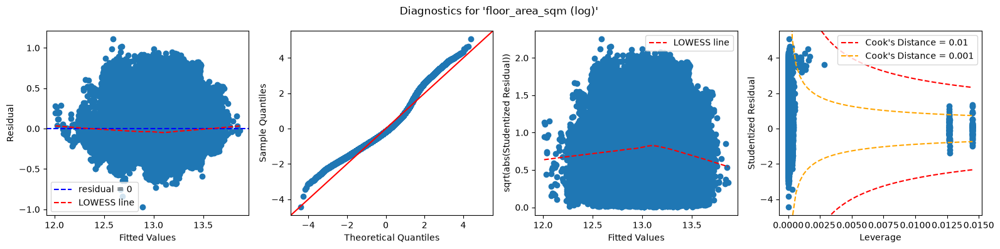

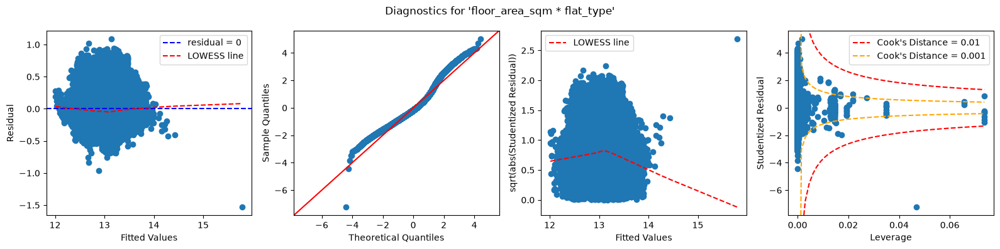

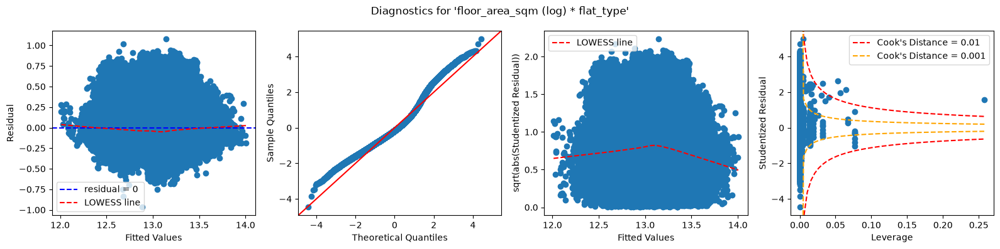

...

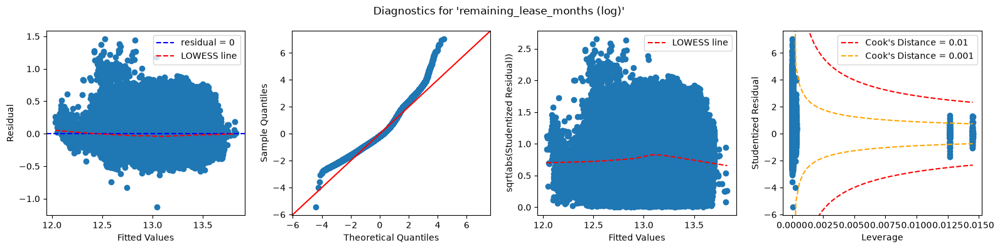

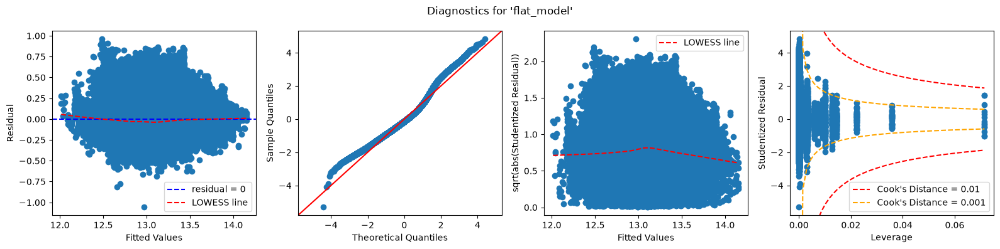

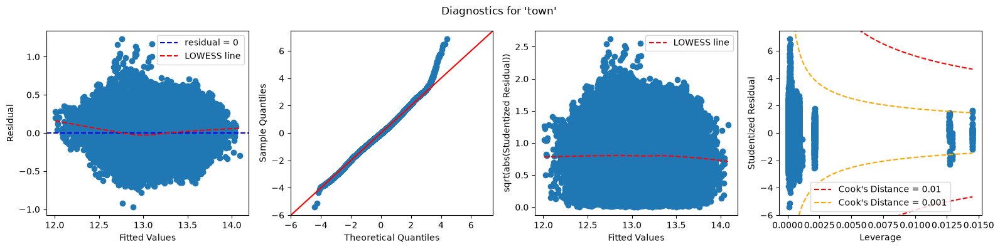

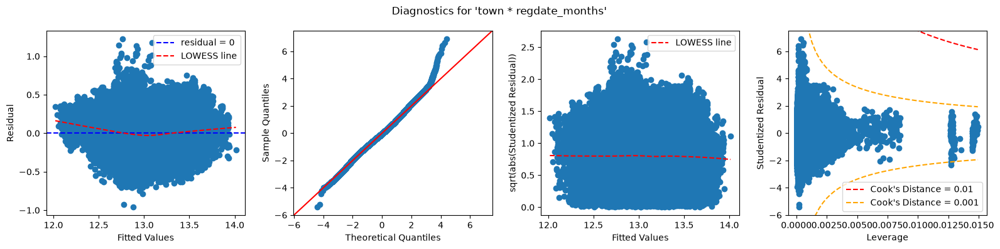

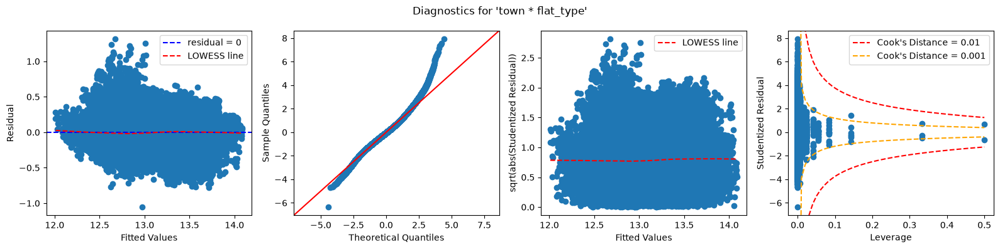

In [49]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['regdate_months', 'flat_type'], {
    'storey_range_cat': ['storey_range_cat'],
    'floor_area_sqm': ['floor_area_sqm'],
    'floor_area_sqm (log)': [('floor_area_sqm', 'log')],
    'floor_area_sqm * flat_type': ['floor_area_sqm', ('floor_area_sqm', 'flat_type')],
    'floor_area_sqm (log) * flat_type': ['floor_area_sqm', (('floor_area_sqm', 'log'), 'flat_type')],
    'remaining_lease_months':   ['remaining_lease_months'],
    'remaining_lease_months (log)': [('remaining_lease_months', 'log')],
    'flat_model': ['flat_model'],
    'town': ['town'],
    'town * regdate_months': ['town', ('regdate_months', 'town')],
    'town * flat_type': ['town', ('flat_type', 'town')], 
})

#### 3 Predictor Model Conclusion
`town` + `town * flat_type` (interaction term) showed the highest training & test R^2 improvement and the best aic / bic values, so I will choose it as the 3rd predictor to include in the model.
I will include the interaction term because it shows a significant improvement in test R^2 compared to without it. (0.649 -> 0.708)

However we have to be careful of the slight left skew in the higher quantiles shown in the Q-Q plot, which tests for residual normality.

### 4 Predictor Variables

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     5726.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:30:11   Log-Likelihood:                 88257.
No. Observations:              190510   AIC:                        -1.762e+05
Df Residuals:                  190377   BIC:                        -1.749e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.767
Model:                            OLS   Adj. R-squared:                  0.767
Method:                 Least Squares   F-statistic:                     4746.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:30:20   Log-Likelihood:                 74258.
No. Observations:              190510   AIC:                        -1.482e+05
Df Residuals:                  190377   BIC:                        -1.469e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.774
Method:                 Least Squares   F-statistic:                     4754.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:30:45   Log-Likelihood:                 77111.
No. Observations:              190510   AIC:                        -1.539e+05
Df Residuals:                  190372   BIC:                        -1.525e+05
Df Model:                         137                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                     4784.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:30:52   Log-Likelihood:                 77565.
No. Observations:              190510   AIC:                        -1.549e+05
Df Residuals:                  190372   BIC:                        -1.535e+05
Df Model:                         137                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.779
Method:                 Least Squares   F-statistic:                     4276.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:31:00   Log-Likelihood:                 79355.
No. Observations:              190510   AIC:                        -1.584e+05
Df Residuals:                  190352   BIC:                        -1.568e+05
Df Model:                         157                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     8546.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:31:08   Log-Likelihood:             1.1985e+05
No. Observations:              190510   AIC:                        -2.394e+05
Df Residuals:                  190377   BIC:                        -2.381e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     8096.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:31:26   Log-Likelihood:             1.2967e+05
No. Observations:              190510   AIC:                        -2.590e+05
Df Residuals:                  190352   BIC:                        -2.574e+05
Df Model:                         157                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     6042.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:31:42   Log-Likelihood:             1.0232e+05
No. Observations:              190510   AIC:                        -2.043e+05
Df Residuals:                  190359   BIC:                        -2.028e+05
Df Model:                         150                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
storey_range_cat,0.0,0.798803,0.798663,-176248.876222,-174897.934047,0.151926,0.756095
floor_area_sqm,0.0,0.766949,0.766788,-148249.536729,-146898.594553,0.164686,0.713405
floor_area_sqm (polynomial),0.0,0.768752,0.768590,-149726.446706,-148365.347071,0.163738,0.716695
floor_area_sqm (log),0.0,0.769297,0.769137,-150178.247730,-148827.305555,0.163891,0.716167
floor_area_sqm * flat_type,0.0,0.773827,0.773664,-153946.070046,-152544.340571,0.162476,0.721044
floor_area_sqm (log) * flat_type,0.0,0.774903,0.774741,-154854.869697,-153453.140221,0.162174,0.722081
floor_area_sqm (log) * town,0.0,0.779094,0.778911,-158394.962149,-156790.083475,0.160521,0.727719
remaining_lease_months,0.0,0.855600,0.855499,-239440.051234,-238089.109059,0.119618,0.848802
remaining_lease_months (log),0.0,0.856914,0.856815,-241181.772759,-239830.830583,0.117108,0.855081


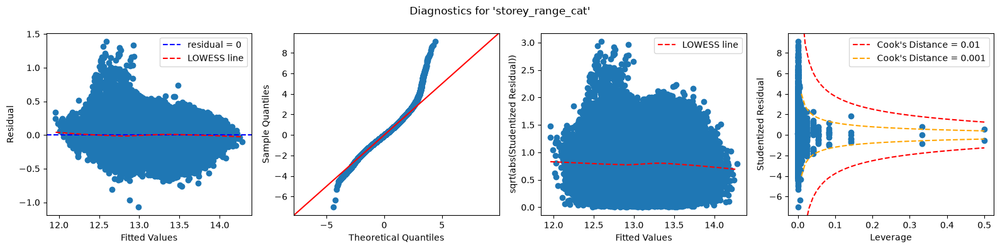

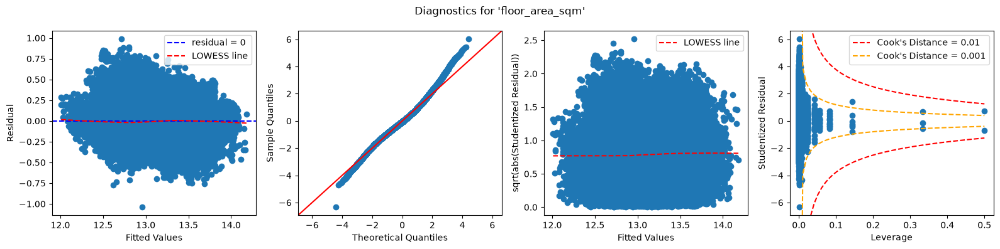

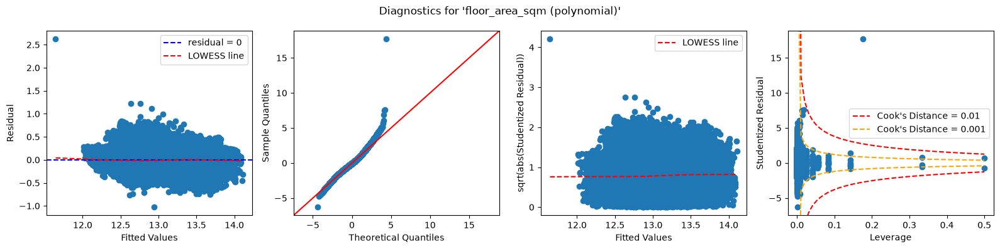

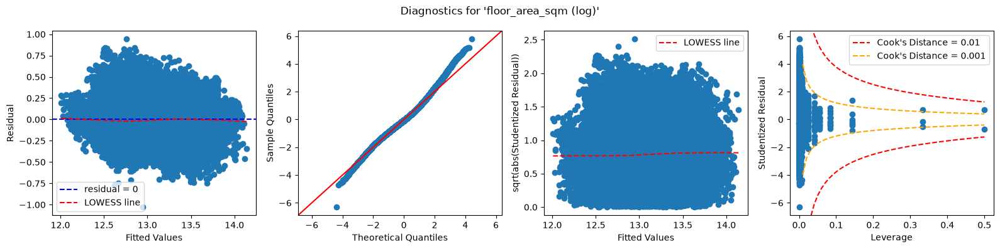

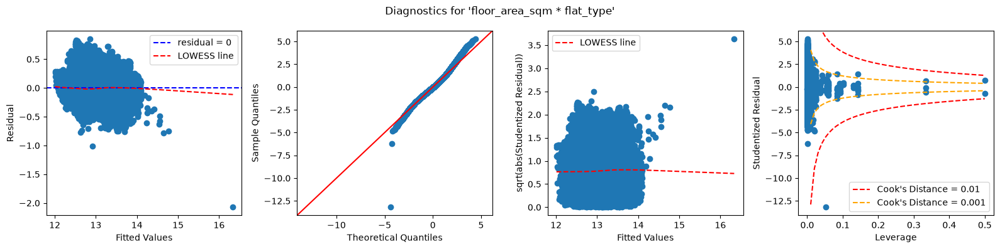

...

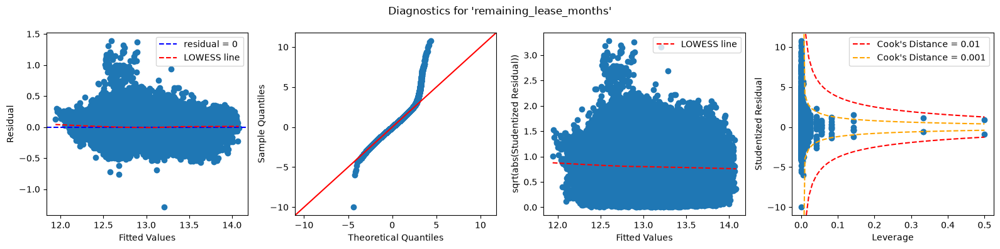

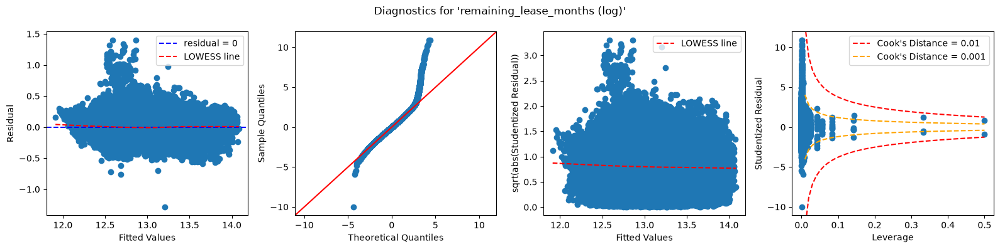

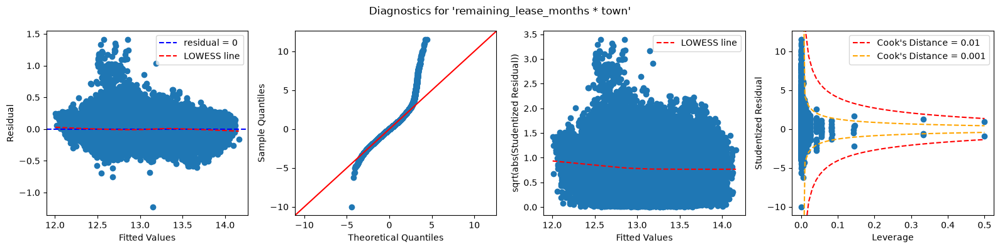

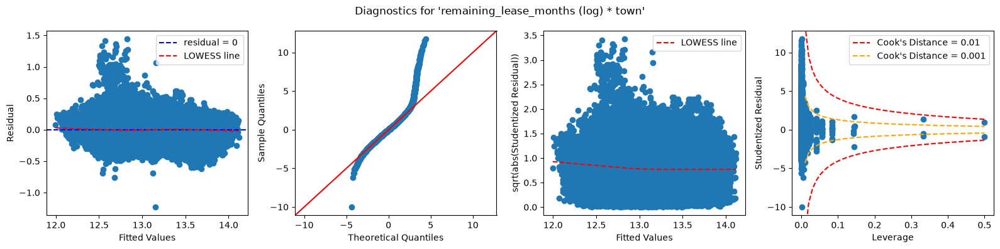

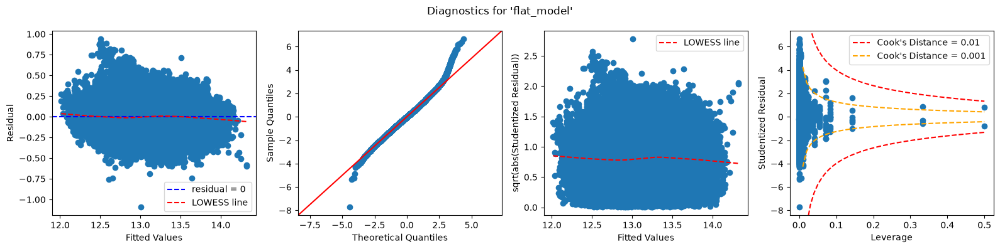

In [97]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['flat_type', 'regdate_months', 'town', ('flat_type', 'town')], {
    'storey_range_cat': ['storey_range_cat'],
    'floor_area_sqm': ['floor_area_sqm'],
    'floor_area_sqm (polynomial)': ['floor_area_sqm', ('floor_area_sqm', 2)],
    'floor_area_sqm (log)': [('floor_area_sqm', 'log')],
    'floor_area_sqm * flat_type': ['floor_area_sqm', ('floor_area_sqm', 'flat_type')],
    'floor_area_sqm (log) * flat_type': [('floor_area_sqm', 'log'), (('floor_area_sqm', 'log'), 'flat_type')],
    'floor_area_sqm (log) * town': [('floor_area_sqm', 'log'), (('floor_area_sqm', 'log'), 'town')],
    'remaining_lease_months': ['remaining_lease_months'],
    'remaining_lease_months (log)': [('remaining_lease_months', 'log')],
    'remaining_lease_months * town': ['remaining_lease_months', ('remaining_lease_months', 'town')],
    'remaining_lease_months (log) * town': [('remaining_lease_months', 'log'), (('remaining_lease_months', 'log'), 'town')],
    'flat_model': ['flat_model'],
})

#### 4 Predictor Model Conclusion
In the analyses below I have selected 4 potential predictors to add to the 3 Predictor Model to make a 4 Predictor Model, sorted in order of test R^2. I did not choose any interaction terms because they did not show substantial improvements to the model.

We can see that while `floor_area_sqm (log)` only showed a small improvement to test R^2, it actually managed to correct the Q-Q plot substantially, making our predictions (e.g. confidence intervals) more reliable.

On the other hand, `remaining_lease_months (log)` showed the strongest improvement to test R^2, but greatly worsened the Q-Q plot, making our predictions much less reliable.

Based on this analysis, to make good predictions with a 4-predictor model, I would choose `regdate_months, flat_type, town, floor_area_sqm (log)` and interaction variable `(flat_type, town)`.

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
3 predictor model,0.0,0.761473,0.761308,-143826.166955,-142485.382239,0.166015,0.708760
floor_area_sqm (log),0.0,0.769297,0.769137,-150178.285228,-148827.343053,0.163885,0.716186
storey_range_cat,0.0,0.798803,0.798664,-176249.302808,-174898.360633,0.151889,0.756215
flat_model,0.0,0.826418,0.826281,-204338.552547,-202804.776093,0.138604,0.796997
remaining_lease_months (log),0.0,0.856914,0.856815,-241182.076353,-239831.134177,0.117113,0.855068


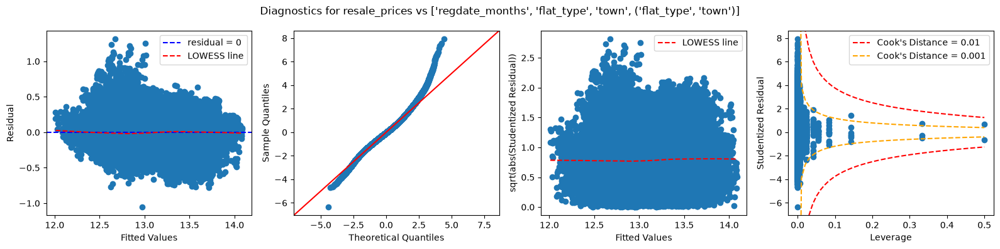

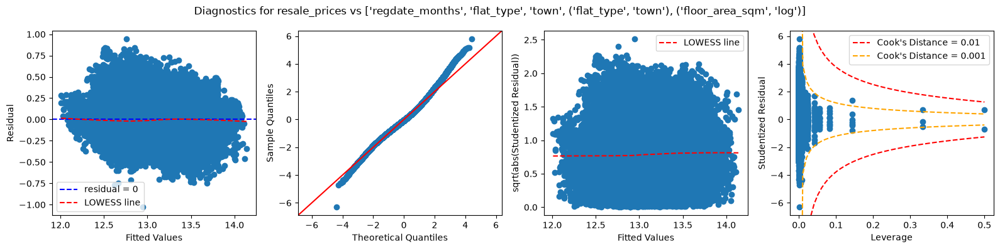

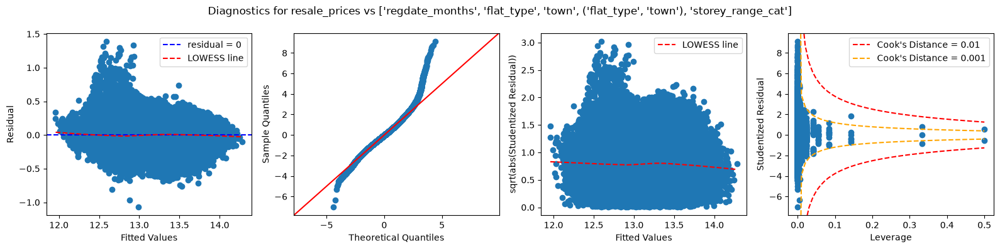

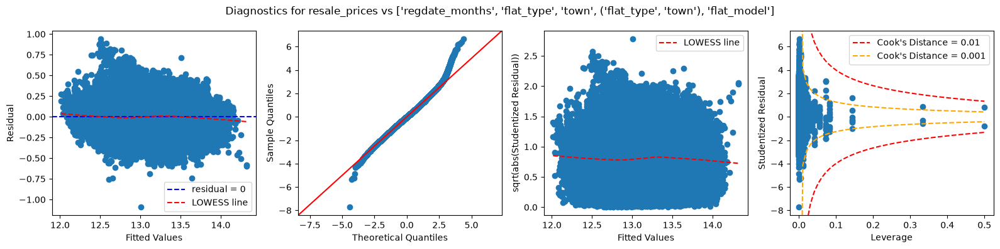

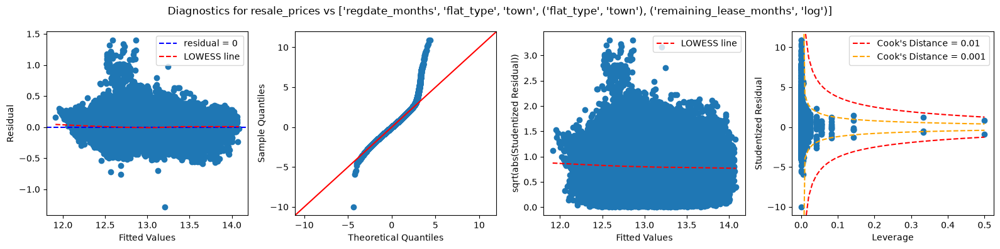

In [ ]:
# Visualizing the best 4-predictor models:
# These are the original 3 Predictor model + 4 Predictor models, sorted in test R^2
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['regdate_months', 'flat_type', 'town', ('flat_type', 'town')], {
    '3 predictor model': [],
    'floor_area_sqm (log)': [('floor_area_sqm', 'log')],
    'storey_range_cat': ['storey_range_cat'],
    'flat_model': ['flat_model'],
    'remaining_lease_months (log)': [('remaining_lease_months', 'log')],
}, print_results=False)

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                 1.577e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:49:28   Log-Likelihood:                 60984.
No. Observations:              190510   AIC:                        -1.219e+05
Df Residuals:                  190476   BIC:                        -1.216e+05
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

c:\Users\jason\Desktop\projects\hdb-resale-prediction\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
original model,0.0,0.732104,0.732057,-121900.956174,-121555.602535,0.179063,0.661181
floor_area_sqm (log) * town,0.0,0.762127,0.762055,-144495.572764,-143896.282626,0.166983,0.705355
flat_type * town,0.0,0.769297,0.769137,-150178.285228,-148827.343053,0.163885,0.716186
both interactions,0.0,0.779094,0.778912,-158395.177633,-156790.298958,0.160493,0.727812
triple interaction,0.0,0.788443,0.788158,-166435.313614,-163824.846402,0.157826,0.736784


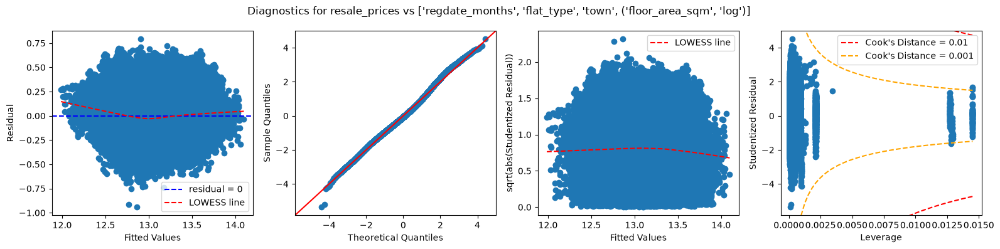

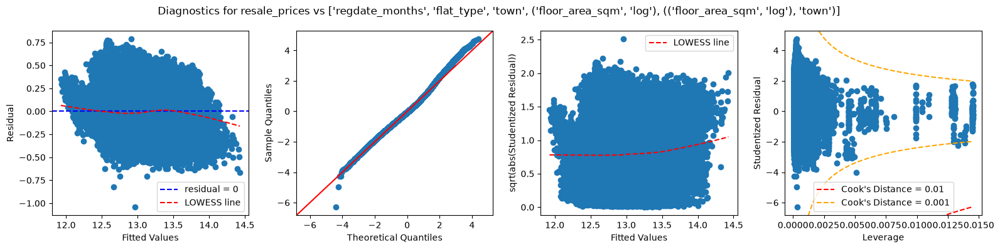

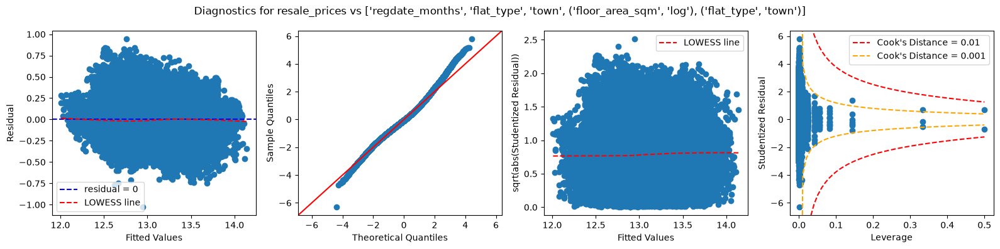

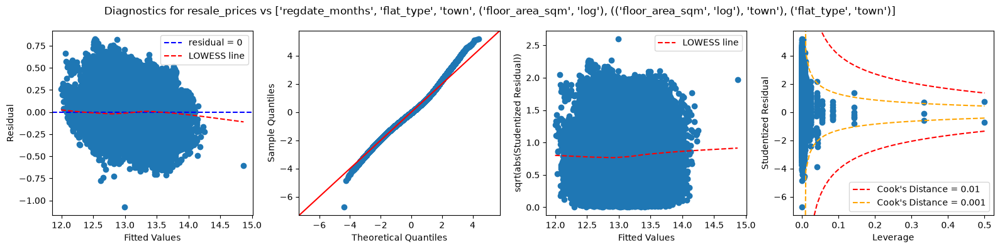

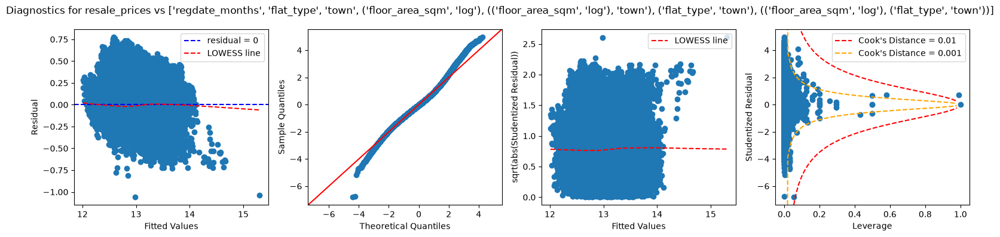

In [ ]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['regdate_months', 'flat_type', 'town', ('floor_area_sqm', 'log')], {
    'original model': [],
    # interactions
    'floor_area_sqm (log) * town': [(('floor_area_sqm', 'log'), 'town')],
    'flat_type * town': [('flat_type', 'town')],
    'both interactions': [(('floor_area_sqm', 'log'), 'town'), ('flat_type', 'town')],
    'triple interaction': [(('floor_area_sqm', 'log'), 'town'), ('flat_type', 'town'), (('floor_area_sqm', 'log'), ('flat_type', 'town'))],
})

### 5 Predictor Model

#### With 4th predictor as `remaining_lease_months (log)`

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.857
Method:                 Least Squares   F-statistic:                     8637.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:30:53   Log-Likelihood:             1.2072e+05
No. Observations:              190510   AIC:                        -2.412e+05
Df Residuals:                  190377   BIC:                        -2.398e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     9539.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:30:59   Log-Likelihood:             1.2951e+05
No. Observations:              190510   AIC:                        -2.588e+05
Df Residuals:                  190376   BIC:                        -2.574e+05
Df Model:                         133                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.875
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                 1.006e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:31:06   Log-Likelihood:             1.3390e+05
No. Observations:              190510   AIC:                        -2.675e+05
Df Residuals:                  190376   BIC:                        -2.662e+05
Df Model:                         133                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     7939.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:31:17   Log-Likelihood:             1.3515e+05
No. Observations:              190510   AIC:                        -2.700e+05
Df Residuals:                  190338   BIC:                        -2.682e+05
Df Model:                         171                                         
Covariance Type:            nonrobust                                         
                                                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     9851.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:31:23   Log-Likelihood:             1.3526e+05
No. Observations:              190510   AIC:                        -2.702e+05
Df Residuals:                  190371   BIC:                        -2.688e+05
Df Model:                         138                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     9859.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:32:02   Log-Likelihood:             1.3533e+05
No. Observations:              190510   AIC:                        -2.704e+05
Df Residuals:                  190371   BIC:                        -2.690e+05
Df Model:                         138                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     8725.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:32:09   Log-Likelihood:             1.3644e+05
No. Observations:              190510   AIC:                        -2.726e+05
Df Residuals:                  190351   BIC:                        -2.709e+05
Df Model:                         158                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.887
Method:                 Least Squares   F-statistic:                     8100.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:32:16   Log-Likelihood:             1.4300e+05
No. Observations:              190510   AIC:                        -2.856e+05
Df Residuals:                  190325   BIC:                        -2.838e+05
Df Model:                         184                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
original 4 predictor model,0.0,0.856914,0.856815,-241181.772759,-239830.830583,0.117108,0.855081
storey_range_cat,0.0,0.869526,0.869435,-258758.851517,-257397.751881,0.111400,0.868864
floor_area_sqm,0.0,0.875392,0.875305,-267522.362902,-266161.263267,0.107268,0.878412
flat_model,0.0,0.872786,0.872685,-263542.838076,-261998.904161,0.110178,0.871724
flat_model * remaining_lease_months (log),0.0,0.877029,0.876918,-269965.158992,-268218.075878,0.108702,0.875138
floor_area_sqm * flat_type,0.0,0.877168,0.877079,-270247.189372,-268835.302437,0.106617,0.879882
floor_area_sqm * town,0.0,0.878421,0.878320,-272160.997834,-270545.961700,0.106471,0.880212
floor_area_sqm * remaining_lease_months (log),0.0,0.875520,0.875432,-267716.029941,-266344.772846,0.107169,0.878635
floor_area_sqm (polynomial),0.0,0.875704,0.875617,-267998.129607,-266626.872511,0.107082,0.878832


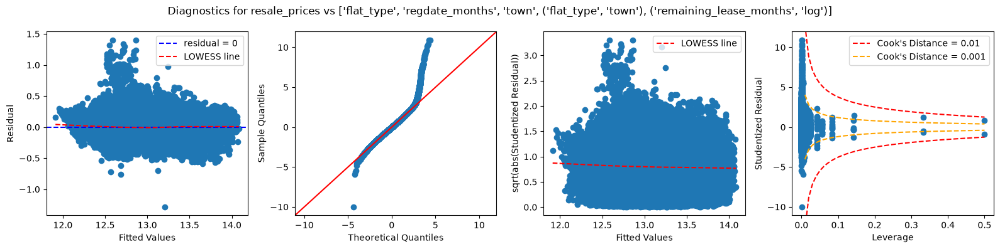

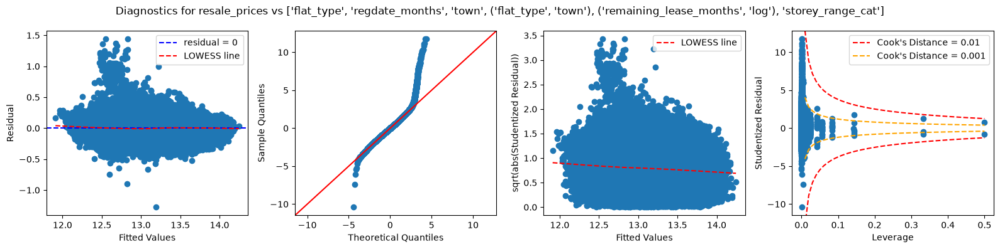

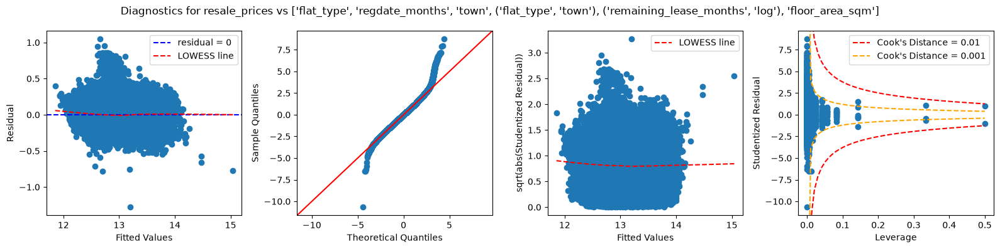

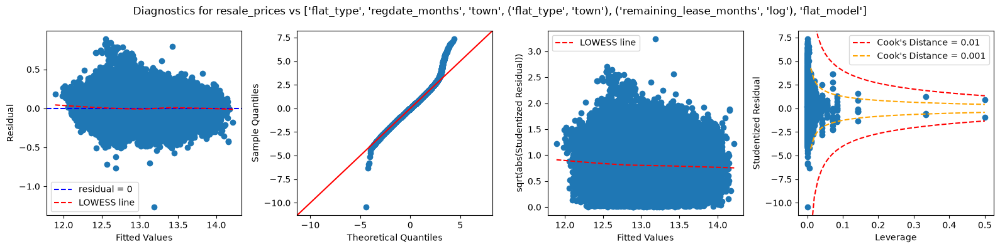

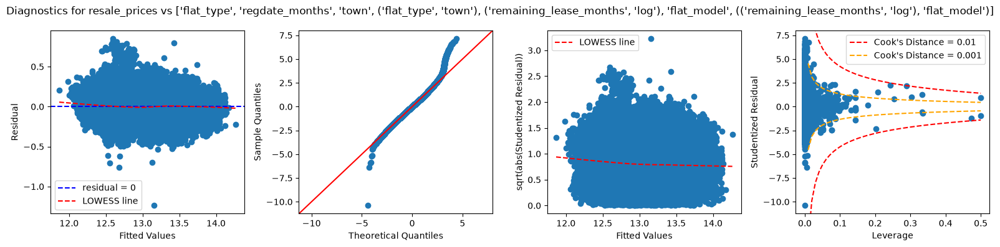

...

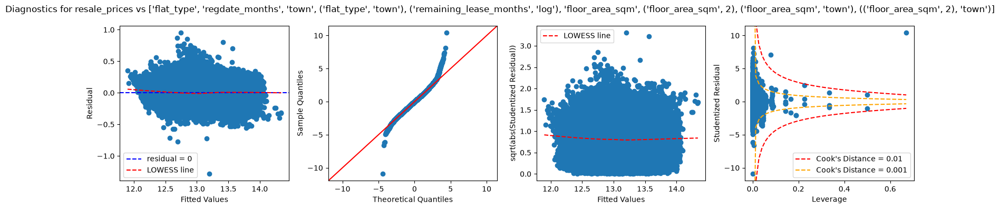

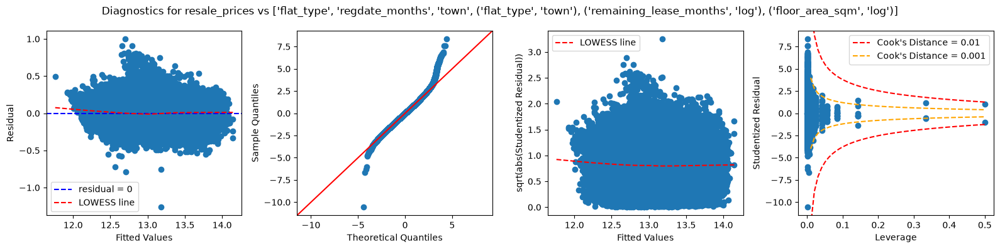

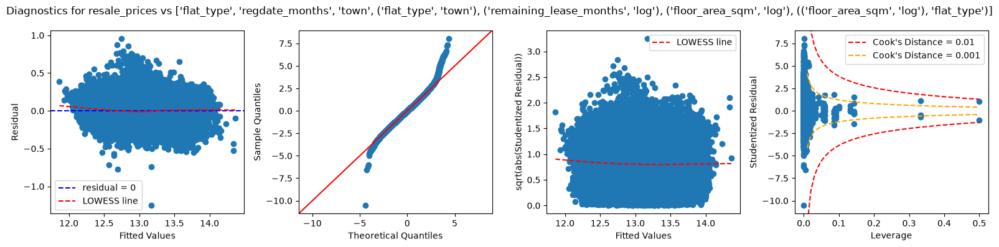

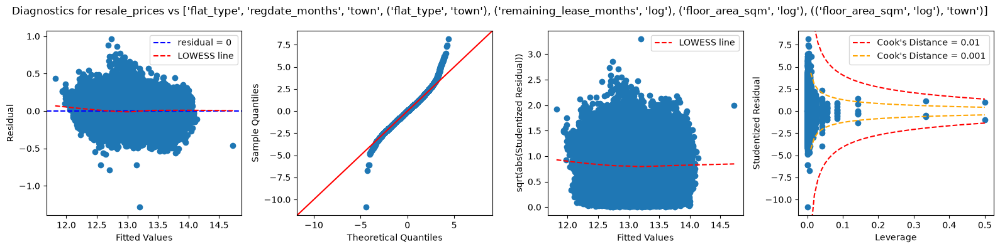

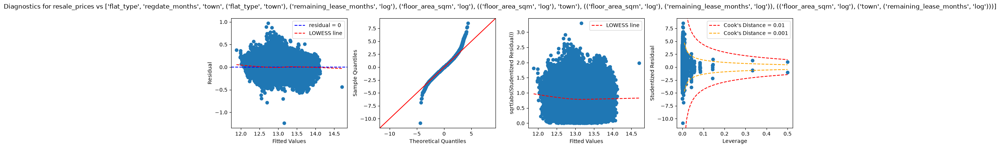

In [ ]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('flat_type', 'town'), ('remaining_lease_months', 'log')], {
                    'original 4 predictor model': [],
                    'storey_range_cat': ['storey_range_cat'],
                    'floor_area_sqm': ['floor_area_sqm'],
                    'flat_model': ['flat_model'],
                    # testing interaction terms
                    'flat_model * remaining_lease_months (log)': ['flat_model', (('remaining_lease_months', 'log'), 'flat_model')],
                    'floor_area_sqm * flat_type': ['floor_area_sqm', ('floor_area_sqm', 'flat_type')],
                    'floor_area_sqm * town': ['floor_area_sqm', ('floor_area_sqm', 'town')],
                    'floor_area_sqm * remaining_lease_months (log)': ['floor_area_sqm', (('remaining_lease_months', 'log'), 'floor_area_sqm')],
                    'floor_area_sqm (polynomial)': ['floor_area_sqm', ('floor_area_sqm', 2)],
                    'floor_area_sqm (polynomial) * flat_type': ['floor_area_sqm', ('floor_area_sqm', 2), ('floor_area_sqm', 'flat_type'), (('floor_area_sqm', 2), 'flat_type')],
                    'floor_area_sqm (polynomial) * town': ['floor_area_sqm', ('floor_area_sqm', 2), ('floor_area_sqm', 'town'), (('floor_area_sqm', 2), 'town')],
                    # testing logarithmic terms
                    'floor_area_sqm (log)': [('floor_area_sqm', 'log')],
                    'floor_area_sqm (log) * flat_type': [('floor_area_sqm', 'log'), (('floor_area_sqm', 'log'), 'flat_type')],
                    'floor_area_sqm (log) * town': [('floor_area_sqm', 'log'), (('floor_area_sqm', 'log'), 'town')],
                    # triple interaction terms
                    'floor_area_sqm (log) * town * remaining_lease_months (log)': [
                        ('floor_area_sqm', 'log'), 
                        (('floor_area_sqm', 'log'), 'town'), (('floor_area_sqm', 'log'), ('remaining_lease_months', 'log')), 
                        (('floor_area_sqm', 'log'), ('town', ('remaining_lease_months', 'log')))],
                })

#### With 4th predictor as `floor_area_sqm (log)`


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.769
Method:                 Least Squares   F-statistic:                     4809.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:29:32   Log-Likelihood:                 75222.
No. Observations:              190510   AIC:                        -1.502e+05
Df Residuals:                  190377   BIC:                        -1.488e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     6094.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:29:39   Log-Likelihood:                 93604.
No. Observations:              190510   AIC:                        -1.869e+05
Df Residuals:                  190376   BIC:                        -1.856e+05
Df Model:                         133                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                 1.016e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:29:46   Log-Likelihood:             1.3472e+05
No. Observations:              190510   AIC:                        -2.692e+05
Df Residuals:                  190376   BIC:                        -2.678e+05
Df Model:                         133                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     6015.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:29:59   Log-Likelihood:             1.0250e+05
No. Observations:              190510   AIC:                        -2.047e+05
Df Residuals:                  190358   BIC:                        -2.031e+05
Df Model:                         151                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     6068.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:30:04   Log-Likelihood:                 93851.
No. Observations:              190510   AIC:                        -1.874e+05
Df Residuals:                  190375   BIC:                        -1.861e+05
Df Model:                         134                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                 1.003e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:30:11   Log-Likelihood:             1.3435e+05
No. Observations:              190510   AIC:                        -2.684e+05
Df Residuals:                  190375   BIC:                        -2.671e+05
Df Model:                         134                                         
Covariance Type:            nonrobust                                         
                                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.845
Method:                 Least Squares   F-statistic:                     6073.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        18:30:16   Log-Likelihood:             1.1318e+05
No. Observations:              190510   AIC:                        -2.260e+05
Df Residuals:                  190338   BIC:                        -2.243e+05
Df Model:                         171                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
original 4 predictor model,0.0,0.769297,0.769137,-150178.247730,-148827.305555,0.163891,0.716167
storey_range_cat,0.0,0.809785,0.809652,-186940.407067,-185579.307431,0.148548,0.766820
remaining_lease_months,0.0,0.876464,0.876378,-269169.298086,-267808.198451,0.108848,0.874802
remaining_lease_months (log),0.0,0.875877,0.875791,-268266.073874,-266904.974239,0.107158,0.878659
flat_model,0.0,0.826741,0.826603,-204691.502457,-203147.568542,0.138748,0.796573
floor_area_sqm (log) * storey_range_cat,0.0,0.810277,0.810144,-187431.919601,-186060.662506,0.148262,0.767719
floor_area_sqm (log) * remaining_lease_months (log),0.0,0.875982,0.875895,-268424.980956,-267053.723861,0.107044,0.878918
floor_area_sqm (log) * flat_model,0.0,0.845115,0.844976,-226009.096392,-224262.013278,0.127966,0.826961


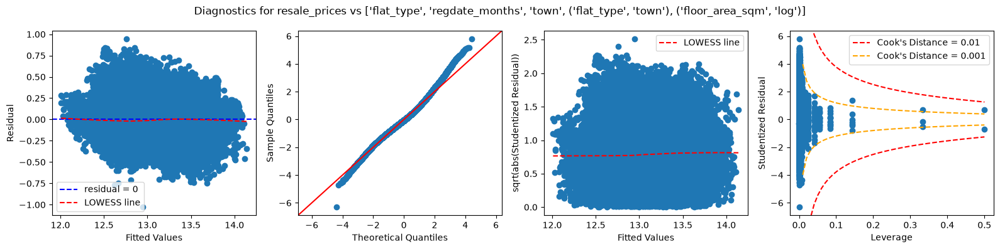

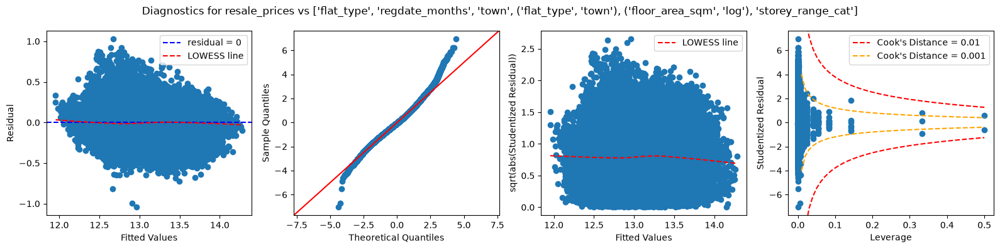

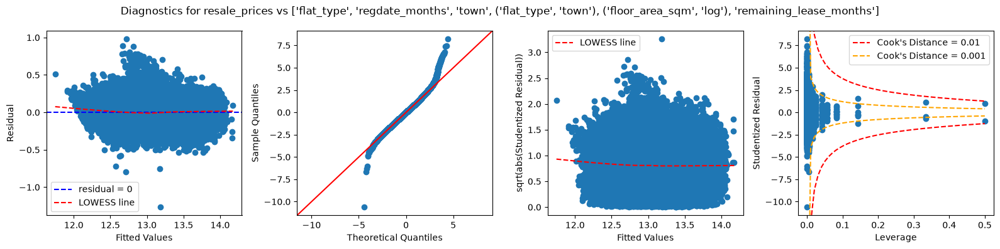

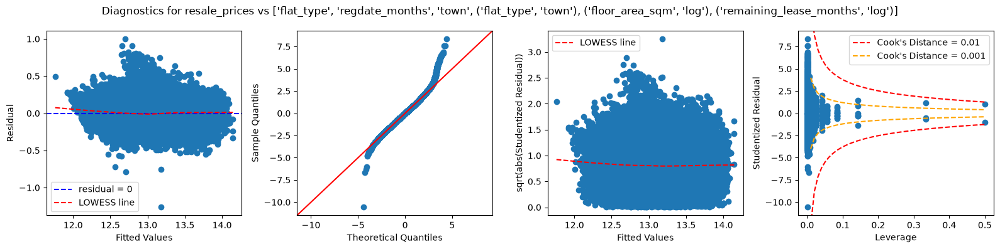

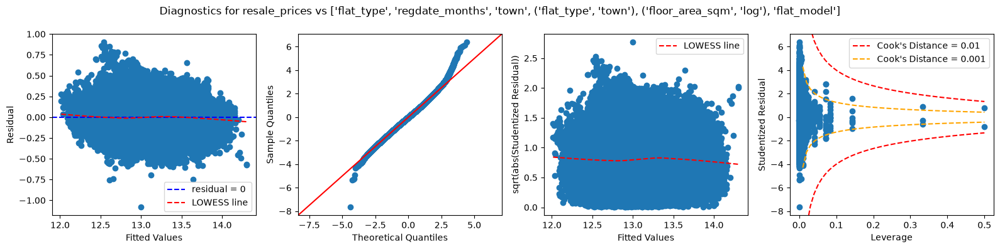

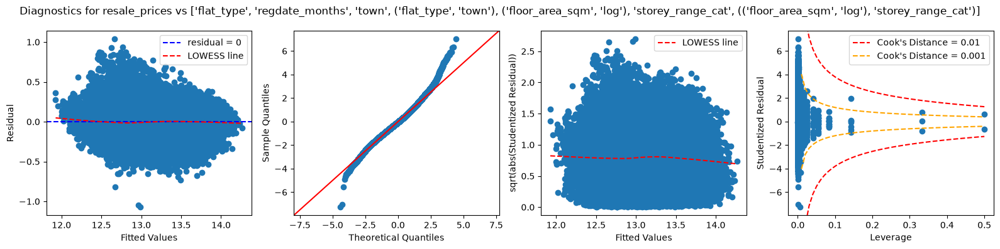

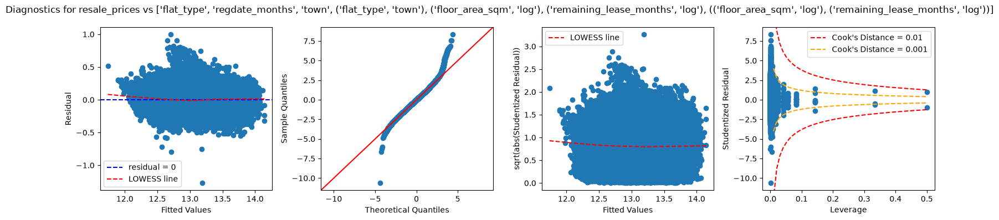

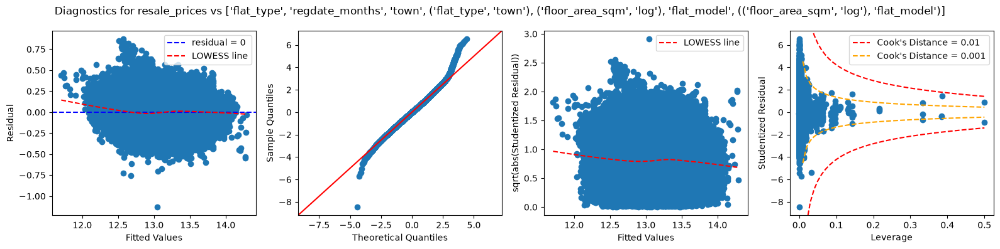

In [ ]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('flat_type', 'town'), ('floor_area_sqm', 'log')], {
                    'original 4 predictor model': [],
                    'storey_range_cat': ['storey_range_cat'],
                    'remaining_lease_months': ['remaining_lease_months'],
                    'remaining_lease_months (log)': [('remaining_lease_months', 'log')],
                    'flat_model': ['flat_model'],
                    # with interaction terms
                    'floor_area_sqm (log) * storey_range_cat': ['storey_range_cat', (('floor_area_sqm', 'log'), 'storey_range_cat')],
                    'floor_area_sqm (log) * remaining_lease_months (log)': [('remaining_lease_months', 'log'), (('floor_area_sqm', 'log'), ('remaining_lease_months', 'log'))],
                    'floor_area_sqm (log) * flat_model': ['flat_model', (('floor_area_sqm', 'log'), 'flat_model')],
                })

### Taking out the `(flat_type, town)` interaction and testing other interactions instead for 5-Predictor Model
From the previous analyses:

The 4 Predictor model with `flat_type, regdate_months, town, floor_area_sqm (log)` and interaction `(flat_type, town)` showed the best diagnostic plots.

However, it is clear that the `remaining_lease_months` variable can have a strong impact on improving the model's explanatory power, and including it will help improve our predictions if we can find a suitable specification. If we simply build a 5-predictor model with `flat_type, regdate_months, town, floor_area_sqm (log), remaining_lease_months (log)`, there will be problems with the Q-Q plot and reducing the reliability of our confidence interval predictions.

In this section I test out whether taking out the `(flat_type, town)` interaction and including other interactions can help with the Q-Q plot normality while not adversely affecting other diagnostics.

#### 1 Interaction Term

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
no interaction,0.0,0.864006,0.863981,-251062.243941,-250706.732843,0.113873,0.862976
town * flat_type,0.0,0.875877,0.875791,-268265.842714,-266904.743078,0.107182,0.878605
town * remaining_lease_months (log),0.0,0.877668,0.877630,-271183.019413,-270573.571815,0.104870,0.883787
town * floor_area_sqm (log),0.0,0.871285,0.871245,-261492.056657,-260882.609059,0.109526,0.873239
town * regdate_months,0.0,0.868246,0.868205,-257046.919031,-256437.471433,0.113378,0.864165
remaining_lease_months (log) * flat_type,0.0,0.865507,0.865479,-253165.278873,-252748.823015,0.113191,0.864612
remaining_lease_months (log) * floor_area_sqm (log),0.0,0.865375,0.865351,-252988.736951,-252623.068392,0.112915,0.865272
remaining_lease_months (log) * regdate_months,0.0,0.864013,0.863988,-251070.842280,-250705.173721,0.113955,0.862778
floor_area_sqm (log) * flat_type,0.0,0.866600,0.866572,-254721.184012,-254314.885613,0.112757,0.865649


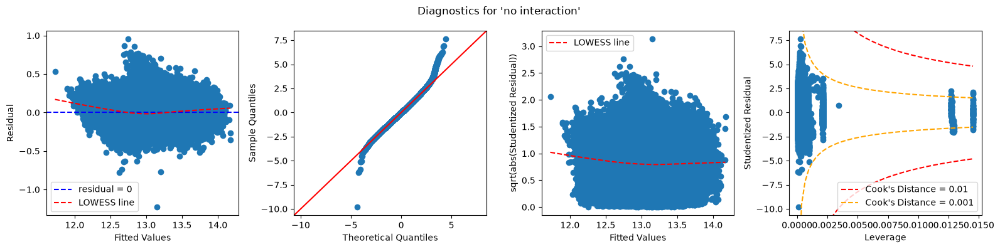

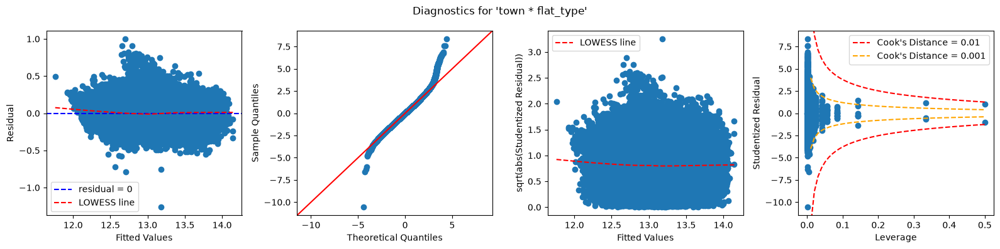

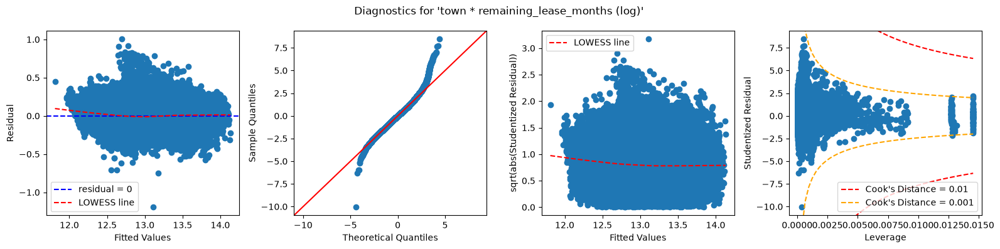

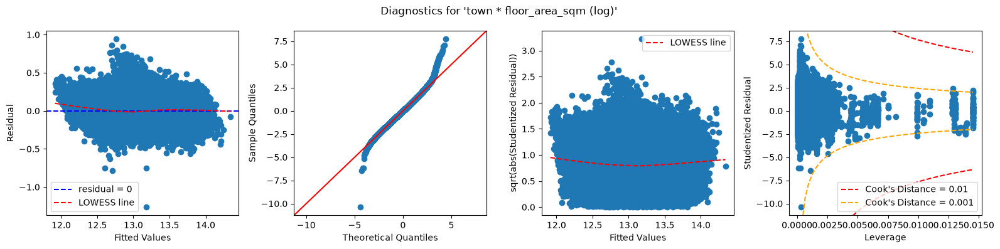

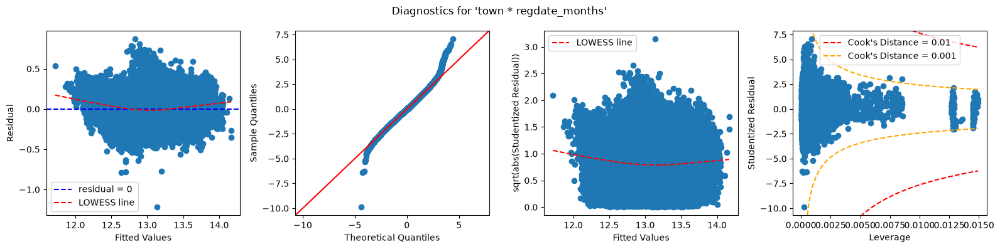

...

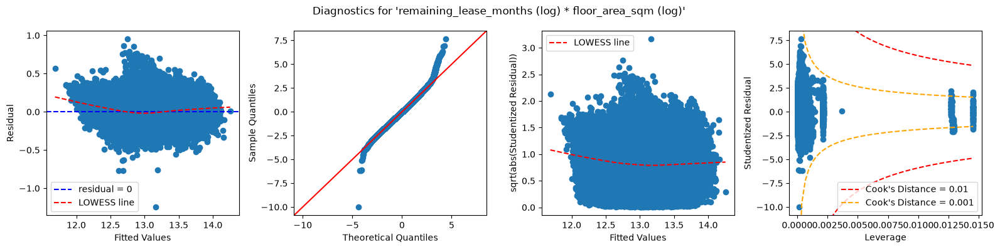

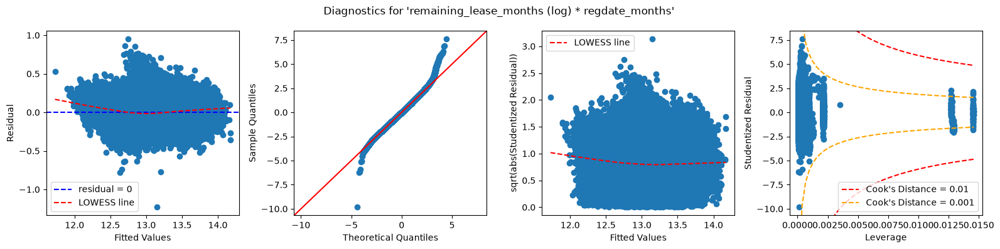

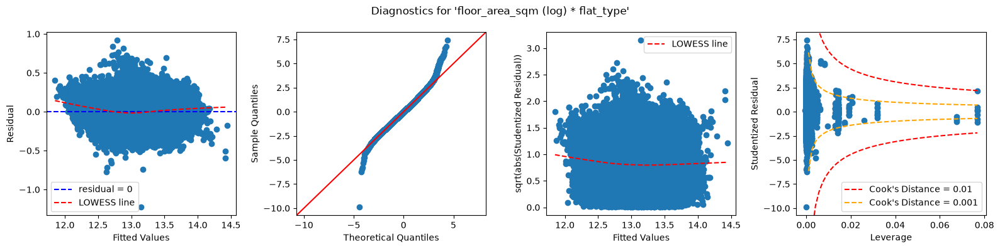

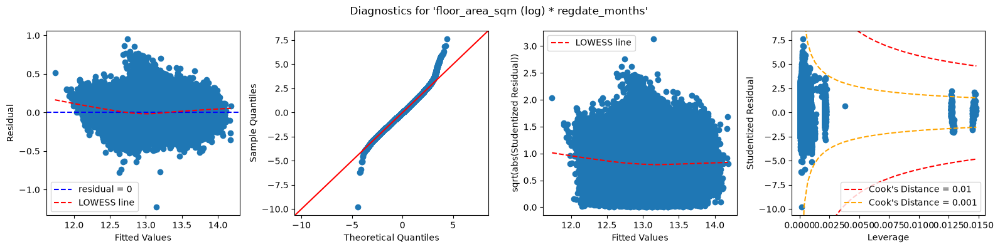

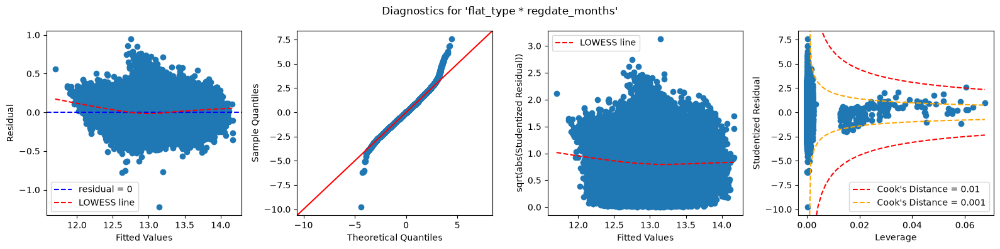

In [98]:
df_int1 = test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('floor_area_sqm', 'log'), ('remaining_lease_months', 'log')], {
                    'no interaction': [],
                    # interaction with town
                    'town * flat_type': [('flat_type', 'town')], # originally included
                    'town * remaining_lease_months (log)': [(('remaining_lease_months', 'log'), 'town')],
                    'town * floor_area_sqm (log)': [(('floor_area_sqm', 'log'), 'town')],
                    'town * regdate_months': [('regdate_months', 'town')],
                    # other interaction terms, I test all possible subsets of 2-way interactions
                    'remaining_lease_months (log) * flat_type': [('flat_type', ('remaining_lease_months', 'log'))],
                    'remaining_lease_months (log) * floor_area_sqm (log)': [(('remaining_lease_months', 'log'), ('floor_area_sqm', 'log'))],
                    'remaining_lease_months (log) * regdate_months': [('regdate_months', ('remaining_lease_months', 'log'))], # no good, decreased in test R^2 of not having any interaction
                    'floor_area_sqm (log) * flat_type': [('flat_type', ('floor_area_sqm', 'log'))],
                    'floor_area_sqm (log) * regdate_months': [('regdate_months', ('floor_area_sqm', 'log'))], # no good, decreased in test R^2 of not having any interaction
                    'flat_type * regdate_months': [('regdate_months', 'flat_type')], # no good, decreased in test R^2 of not having any interaction
                }, print_results=False)
df_int1

#### 2 Interaction Terms

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sq

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test,r2_comp,improvement
feature,,,,,,,,,
town * flat_type + town * remaining_lease_months (log),0.0,0.884150,0.884053,-281355.610618,-279740.574484,0.101784,0.890525,0.883787,0.006738
town * flat_type + town * floor_area_sqm (log),0.0,0.878677,0.878577,-272563.030352,-270947.994218,0.106571,0.879985,0.878605,0.001380
town * flat_type + town * regdate_months,0.0,0.879959,0.879859,-274585.641293,-272970.605158,0.107008,0.879000,0.878605,0.000395
town * flat_type + remaining_lease_months (log) * flat_type,0.0,0.876687,0.876597,-269501.328133,-268079.283737,0.107434,0.878034,0.878605,-0.000572
town * flat_type + remaining_lease_months (log) * floor_area_sqm (log),0.0,0.875982,0.875895,-268424.929979,-267053.672884,0.107052,0.878901,0.878605,0.000295
town * flat_type + floor_area_sqm (log) * flat_type,0.0,0.877254,0.877165,-270380.019057,-268968.132121,0.106796,0.879478,0.878605,0.000873
town * remaining_lease_months (log) + town * floor_area_sqm (log),0.0,0.882290,0.882238,-278469.562560,-277606.178463,0.102583,0.888799,0.883787,0.005012
town * remaining_lease_months (log) + town * regdate_months,0.0,0.881425,0.881373,-277074.966675,-276211.582578,0.105022,0.883449,0.883787,-0.000338
town * remaining_lease_months (log) + remaining_lease_months (log) * flat_type,0.0,0.878373,0.878331,-272271.045951,-271600.653593,0.104669,0.884231,0.883787,0.000445


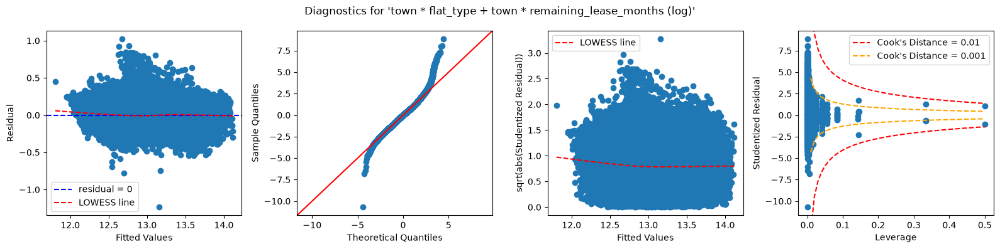

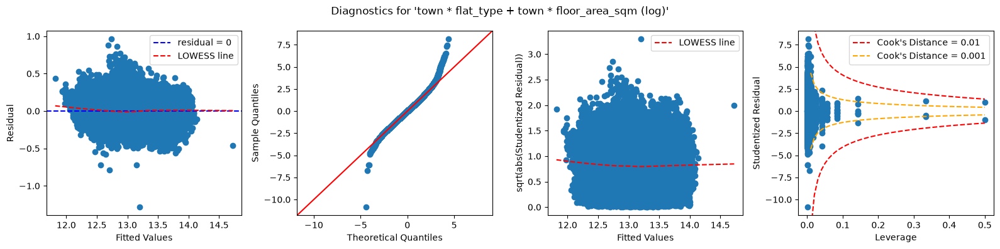

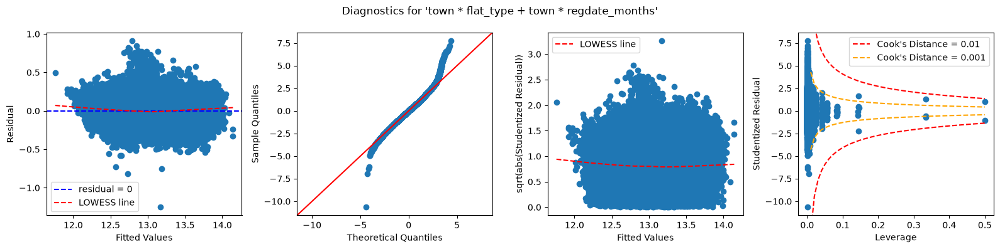

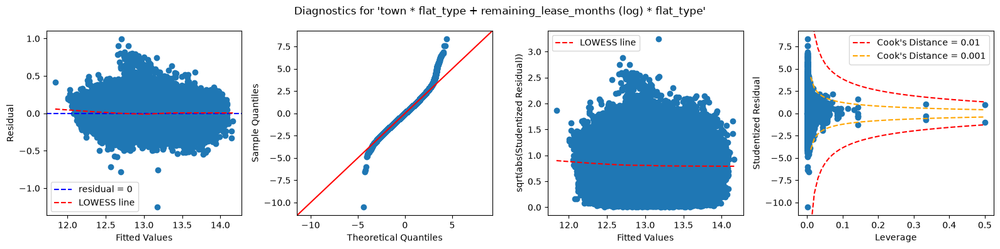

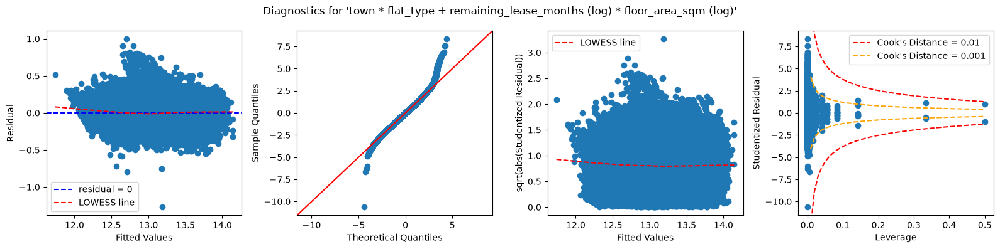

...

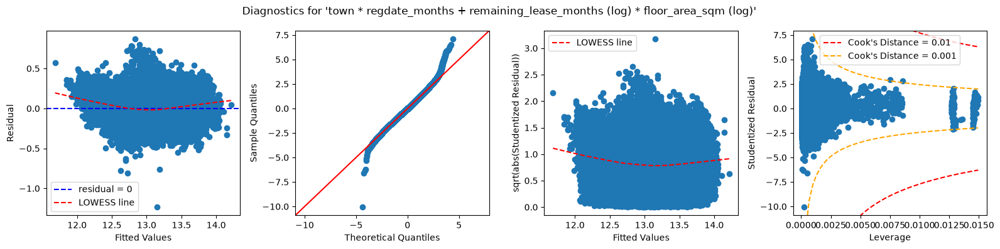

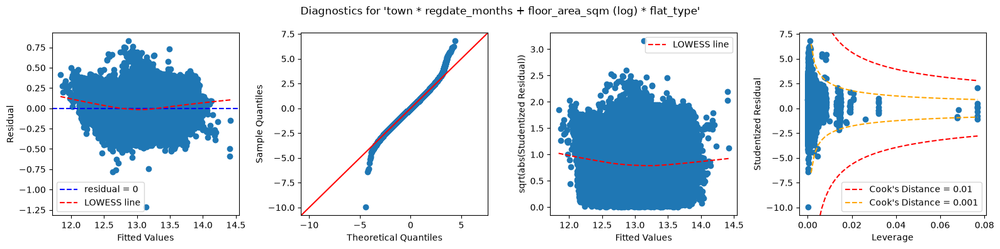

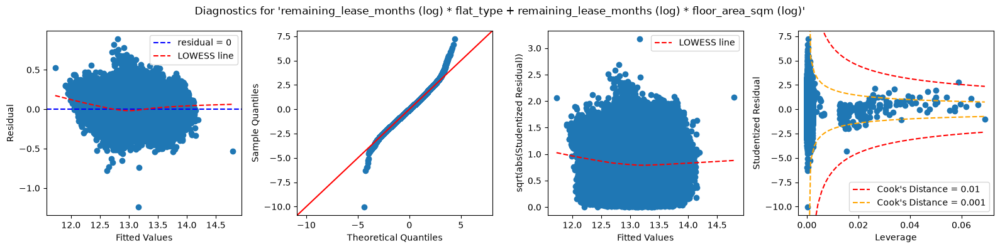

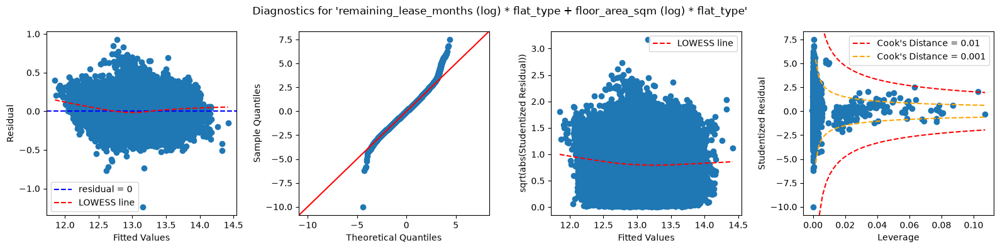

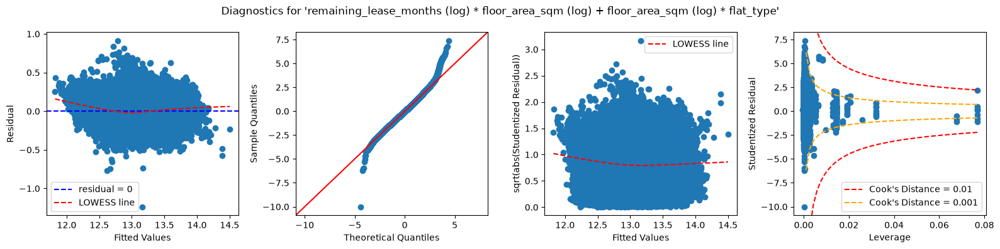

In [90]:
# from 1 Interaction Term analyses, these are the interactions that provided a benefit in comparison to having NO interaction terms in the model.
# I use this list to generate all possible 2-interaction subsets.
# Since there are 7 interaction terms here, that makes 21 possible 2-interaction term models.
interaction_1 = {
    'town * flat_type': ('flat_type', 'town'),
    'town * remaining_lease_months (log)': (('remaining_lease_months', 'log'), 'town'),
    'town * floor_area_sqm (log)': (('floor_area_sqm', 'log'), 'town'),
    'town * regdate_months': ('regdate_months', 'town'),
    'remaining_lease_months (log) * flat_type': (('remaining_lease_months', 'log'), 'flat_type'),
    'remaining_lease_months (log) * floor_area_sqm (log)': (('remaining_lease_months', 'log'), ('floor_area_sqm', 'log')),
    'floor_area_sqm (log) * flat_type': (('floor_area_sqm', 'log'), 'flat_type'),
}
arr = list(interaction_1.items())
interaction_2 = {}
r2_comp = {}

for i in range(len(arr) - 1):
    for j in range(i + 1, len(arr)):
        int_name = f"{arr[i][0]} + {arr[j][0]}"
        interaction_2[int_name] = [arr[i][1], arr[j][1]]
        r2_comp[int_name] = max(df_int1.loc[arr[i][0]]['r2_test'], df_int1.loc[arr[j][0]]['r2_test'])

df_int2 = test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('floor_area_sqm', 'log'), ('remaining_lease_months', 'log')],
                interaction_2, print_results=False)

# r2_comp contains the highest test R^2 value of an interaction (the value comes from the 1-interaction models) from each 2-interaction pair
# this computes the improvement of having 2 interactions over 1 of the interactions in the same pair
for int_name, value in r2_comp.items():
    df_int2.loc[int_name, 'r2_comp'] = value
    df_int2.loc[int_name, 'improvement'] = df_int2.loc[int_name, 'r2_test'] - df_int2.loc[int_name, 'r2_comp']
df_int2

#### 3 Interaction Terms

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sq

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test,r2_comp,improvement
feature,,,,,,,,,
interaction 012,0.0,0.886682,0.886573,-285515.965654,-283646.993020,0.100763,0.892711,0.890525,0.002186
interaction 015,0.0,0.884183,0.884086,-281408.756497,-279783.562903,0.101789,0.890515,0.890525,-0.000010
interaction 016,0.0,0.885579,0.885481,-283710.038196,-282044.214762,0.101298,0.891569,0.890525,0.001044
interaction 025,0.0,0.878767,0.878666,-272701.353233,-271076.159639,0.106426,0.880311,0.879985,0.000326
interaction 026,0.0,0.879928,0.879825,-274526.577506,-272860.754071,0.106085,0.881078,0.879985,0.001093
interaction 035,0.0,0.880023,0.879922,-274684.946999,-273059.753405,0.107031,0.878949,0.879000,-0.000052
interaction 036,0.0,0.881317,0.881215,-276743.008980,-275077.185546,0.106600,0.879920,0.879478,0.000443
interaction 056,0.0,0.877267,0.877177,-270399.082608,-268977.038212,0.106803,0.879463,0.879478,-0.000015
interaction 124,0.0,0.883058,0.883003,-279704.640365,-278780.311508,0.102099,0.889847,0.888799,0.001048


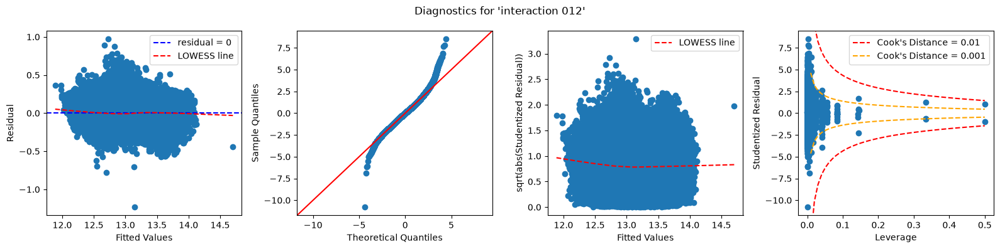

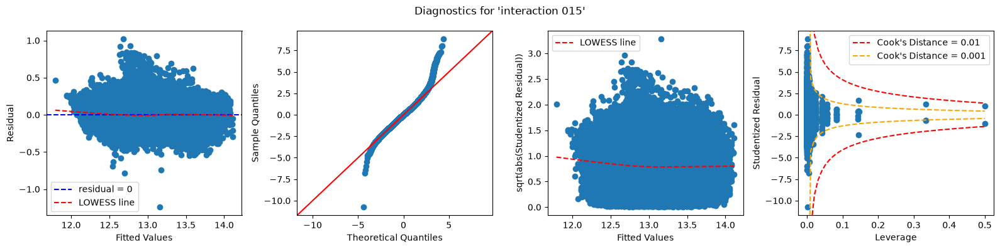

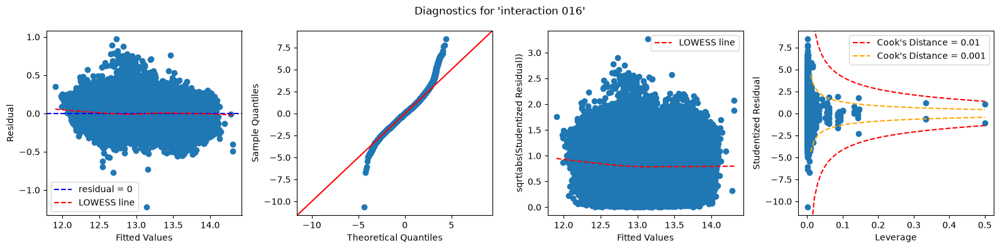

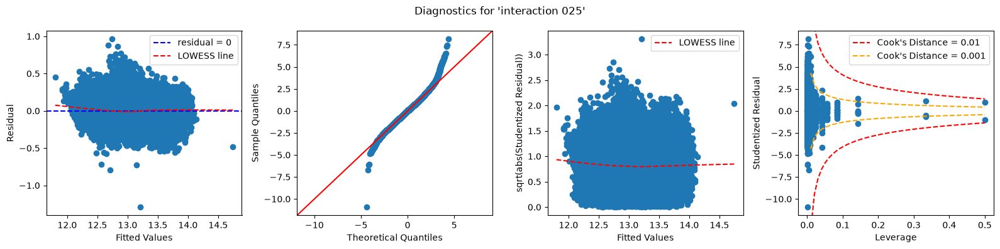

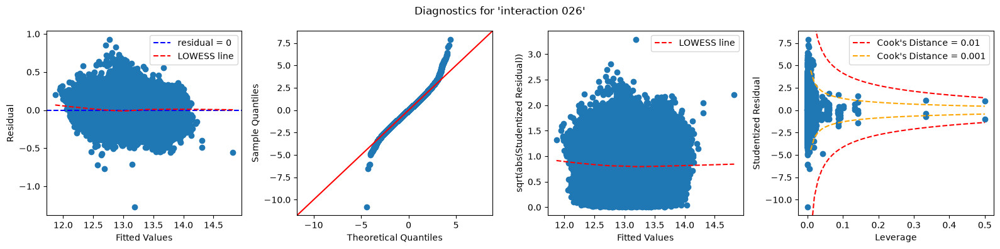

...

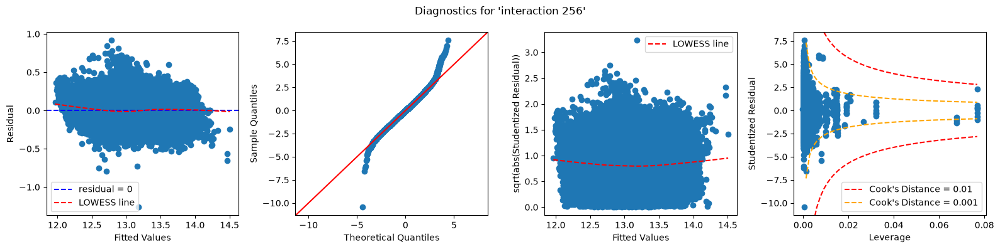

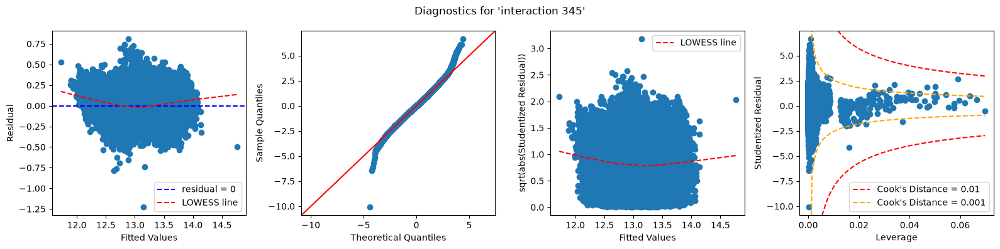

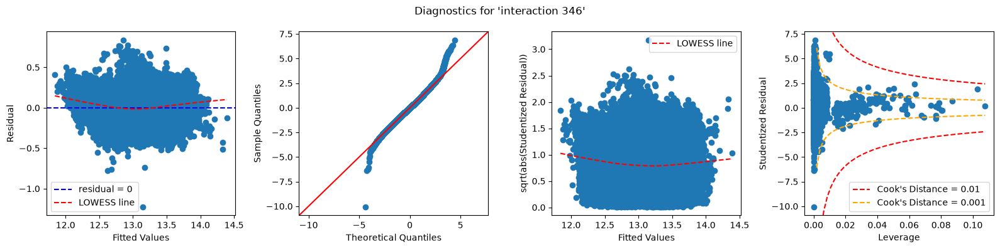

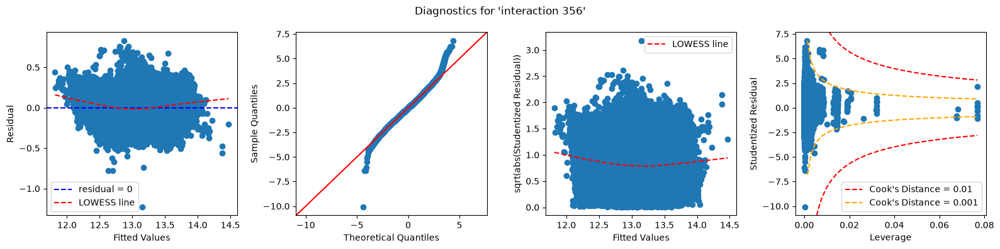

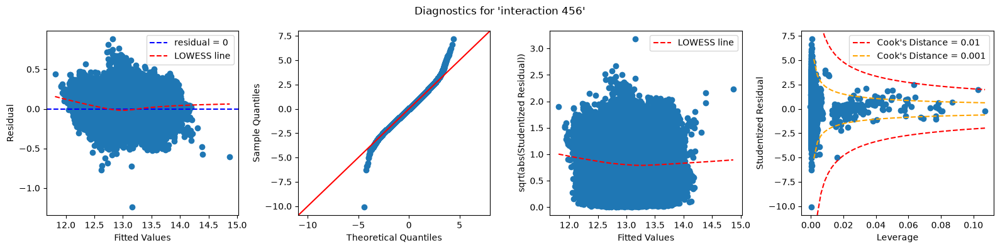

In [93]:
# Similarly, here we look at models with 3 interaction terms.
# With 7 interactions, there are a total of 35 3-interaction combinations.

arr = list(interaction_1.items())
interaction_3 = {}
r2_comp = {}

for i in range(len(arr) - 2):
    for j in range(i + 1, len(arr) - 1):
        for k in range(j + 1, len(arr)):
            # int_name = f"{arr[i][0]} + {arr[j][0]} + {arr[k][0]}"
            int_name = f"interaction {i}{j}{k}" # name is too long so I will simply use the indexes

            r2_ij, improv_ij = df_int2.loc[f"{arr[i][0]} + {arr[j][0]}"]['r2_test'], df_int2.loc[f"{arr[i][0]} + {arr[j][0]}"]['improvement']
            r2_ik, improv_ik = df_int2.loc[f"{arr[i][0]} + {arr[k][0]}"]['r2_test'], df_int2.loc[f"{arr[i][0]} + {arr[k][0]}"]['improvement']
            r2_jk, improv_jk = df_int2.loc[f"{arr[j][0]} + {arr[k][0]}"]['r2_test'], df_int2.loc[f"{arr[j][0]} + {arr[k][0]}"]['improvement']

            if improv_ij < 0 or improv_ik < 0 or improv_jk < 0:
                # skip if any 2-interaction pairs in the triplet are not improvements from the 1-interaction case
                continue

            interaction_3[int_name] = [arr[i][1], arr[j][1], arr[k][1]]
            r2_comp[int_name] = max(r2_ij, r2_ik, r2_jk)

df_int3 = test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('floor_area_sqm', 'log'), ('remaining_lease_months', 'log')],
                interaction_3, print_results=False)

# r2_comp contains the highest test R^2 value of an interaction (the value comes from the 1-interaction models) from each 2-interaction pair
# this computes the improvement of having 2 interactions over 1 of the interactions in the same pair
for int_name, value in r2_comp.items():
    df_int3.loc[int_name, 'r2_comp'] = value
    df_int3.loc[int_name, 'improvement'] = df_int3.loc[int_name, 'r2_test'] - df_int3.loc[int_name, 'r2_comp']
df_int3

#### Conclusion of interaction terms with 5-Predictor model
While the interaction terms have helped to improve the Residual-Fitted Values plot, they did not actually show any substantial improvement to the Q-Q plot. Furthermore, their inclusion also did not improve the test R^2 significantly. It is hence likely that a good 5-Predictor model is difficult or impossible to achieve with linear regression.

### Is `(flat_type, town)` the most suitable interaction in the 4-Predictor model?
Since `(flat_type, town)` showed the best R^2 when adding the `town` predictor, I have included it when building the 4-Predictor and 5-Predictor models.

In this section I investigate whether it is the best interaction or if other interactions with our 4th predictor, `floor_area_sqm (log)`, are better.

#### Code

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                 1.577e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:57:32   Log-Likelihood:                 60984.
No. Observations:              190510   AIC:                        -1.219e+05
Df Residuals:                  190476   BIC:                        -1.216e+05
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.739
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                 1.423e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:57:45   Log-Likelihood:                 63633.
No. Observations:              190510   AIC:                        -1.272e+05
Df Residuals:                  190471   BIC:                        -1.268e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:39: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_001 = np.sqrt(0.01 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.01
C:\Users\jason\AppData\Local\Temp\ipykernel_9688\1346809592.py:40: RuntimeWarning: invalid value encountered in sqrt
  cooks_dist_0001 = np.sqrt(0.001 * num_predictors * (1 - leverage_x) / leverage_x) # Cook's Dist = 0.001


                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.762
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                 1.052e+04
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        21:57:49   Log-Likelihood:                 72307.
No. Observations:              190510   AIC:                        -1.445e+05
Df Residuals:                  190451   BIC:                        -1.439e+05
Df Model:                          58                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
no interaction,0.0,0.732104,0.732057,-121900.956174,-121555.602535,0.179063,0.661181
flat_type * town,0.0,0.769297,0.769137,-150178.152065,-148827.209889,0.163869,0.716242
floor_area_sqm (log) * flat_type,0.0,0.739449,0.739397,-127187.755155,-126791.614217,0.176767,0.669816
floor_area_sqm (log) * town,0.0,0.762127,0.762055,-144495.572764,-143896.282626,0.166983,0.705355
floor_area_sqm (log) * regdate_months,0.0,0.732311,0.732263,-122046.667994,-121691.156895,0.178795,0.662194


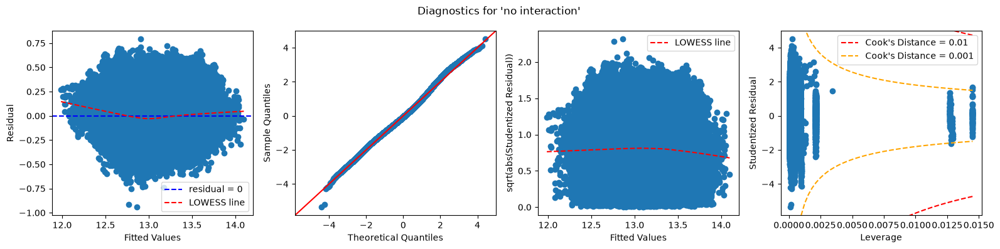

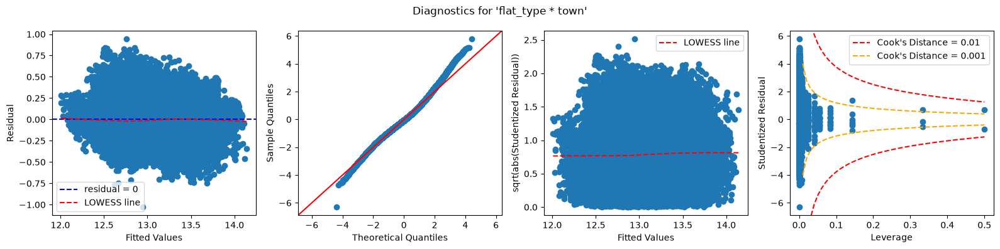

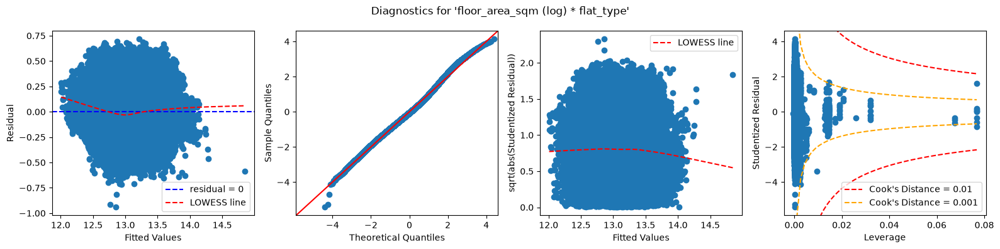

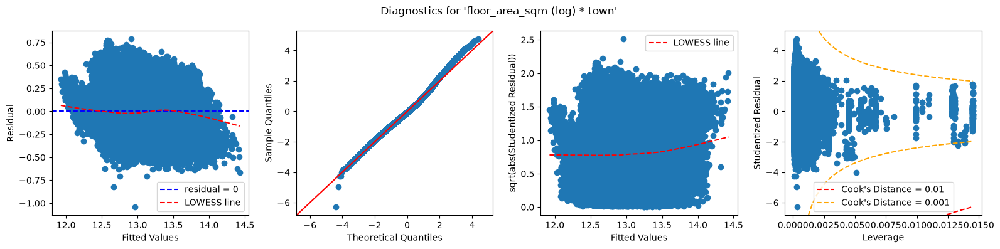

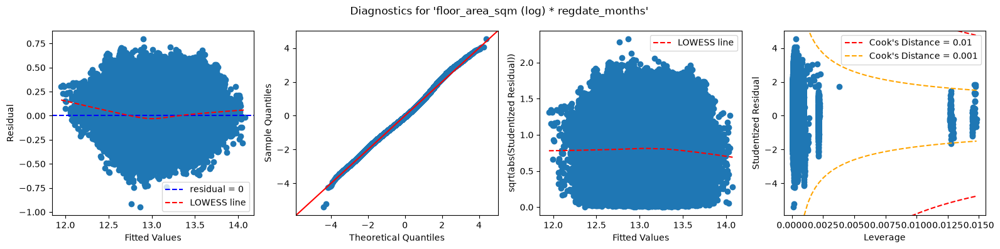

In [103]:
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test),
                ['flat_type', 'regdate_months', 'town', ('floor_area_sqm', 'log')], {
                    'no interaction': [],
                    'flat_type * town': [('flat_type', 'town')], # original interaction
                    'floor_area_sqm (log) * flat_type': [(('floor_area_sqm', 'log'), 'flat_type')],
                    'floor_area_sqm (log) * town': [(('floor_area_sqm', 'log'), 'town')],
                    'floor_area_sqm (log) * regdate_months': [(('floor_area_sqm', 'log'), 'regdate_months')],
                })

#### Conclusion
Yes, `(flat_type, town)` seems to be the best interaction variable to include in the 4 Predictor model.

## Conclusion

So far, the best model we have is probably the 4 predictor model `regdate_months, flat_type, town, floor_area_sqm (log)` with interaction `(flat_type, town)`. Our target variable is `resale_price (log)`.

This model is not without issues. For rarer flats (e.g. multi-generation flats) there may not be sufficient data for a strong enough pattern to appear. The underlying data probably follows some non-linear pattern, so a linear model may not be the best for accurate predictions. In the future, it is possible to investigate this dataset again with more complex, non-linear models.

Despite these shortcomings, the model has a test R^2 of 0.71, this means it is able to explain at least 71% of the variability in HDB resale prices. A linear regression model is also well-known for its high-interpretability - we can look at the coefficients and intervals of a model and understand how much each predictor affects the target variable.

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.769
Method:                 Least Squares   F-statistic:                     4809.
Date:                Wed, 29 Jul 2026   Prob (F-statistic):               0.00
Time:                        22:12:29   Log-Likelihood:                 75222.
No. Observations:              190510   AIC:                        -1.502e+05
Df Residuals:                  190377   BIC:                        -1.488e+05
Df Model:                         132                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

,f_pvalue,rsquared,rsquared_adj,aic,bic,rmse_test,r2_test
feature,,,,,,,
4 Predictor Model,0.0,0.769297,0.769137,-150178.285228,-148827.343053,0.163885,0.716186


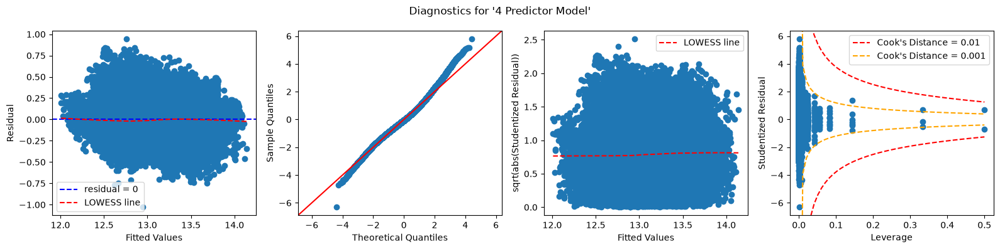

In [ ]:
# The final model's coefficients,  t-statistics, etc. are shown here
test_predictors(ResalePrices_Train, np.log(y_Train), ResalePrices_Test, np.log(y_Test), ['regdate_months', 'flat_type', ('floor_area_sqm', 'log'), 'town', ('flat_type', 'town')], {'4 Predictor Model': []})